<img src="https://github.com/djp840/MSDS_453_Public/blob/main/images/NorthwesternHeader.png?raw=1">

## MSDS453 - Research Assignment 01 - First Vectorized Representation


Our goal in this exercise is to BEGIN coming to a common agreement, among this class, as to what terms we will use as we selectively refine our corpus-wide vocabulary. This corpus vocabulary is what would represent the content of each different document for clustering and classification purposes, which will be our next step. This means that we need to make decisions - what is in, what is out.

In [1]:
# Workaround for numpy downgrade caused by gensim

# Cell 1: Pre-installation Setup
# This cell will prepare the environment with compatible versions
# IMPORTANT: Put this at the very beginning of your notebook

# First, install the correct numpy version that gensim requires
#!pip install numpy==1.26.4 --force-reinstall


In [1]:
# Cell 2

# After the session is restarted, run this cell and Cell 3 and below too.
# Then install gensim with the specific dependencies
!pip install gensim==4.3.3
#!pip install scipy==1.13.1

# Force restart the runtime programmatically
import os
import IPython

# This will restart the runtime without user intervention
#try:
 #   os._exit(00)
#except:
#    pass

# In Google Colab, the notebook will end (crash) here.

In [3]:
# Cell 3: Verify installation and import all libraries
# After the automatic restart, this will be the first cell to run

# In Google Colab, select Runtime > Run cell and below
import numpy as np
print(f"NumPy version: {np.__version__}")

import gensim
print(f"Gensim version: {gensim.__version__}")

NumPy version: 1.26.4
Gensim version: 4.3.3


In [2]:
import pandas as pd
import os
import numpy as np
import re
import string
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
import random
from dataclasses import dataclass

from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem import PorterStemmer

import gensim
from gensim.models import Word2Vec
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import TSNE

import scipy.cluster.hierarchy

from IPython.display import display, HTML

from typing import List, Callable, Dict

### Mount Google Drive to Colab Environment

<div class="alert alert-block alert-success">
    <b>Directories Required for Research Assignment</b>:<br>
1. Data Directory - Source Class Corpus Data<br>
2. Output Directory - Vocabulary<br>
</div>

#### Uncomment To Map Drive

In [3]:
from google.colab import drive
#drive.mount('/content/gdrive/My Drive')
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


### NLTK Downloads

In [4]:
# Only run this once, they will be downloaded.
nltk.download('stopwords',quiet=True)
nltk.download('wordnet',quiet=True)
#nltk.download('punkt',quiet=True)  # replaced by punkt due to "unsafe pickling" by NLTK developers
nltk.download('punkt_tab',quiet=True)
nltk.download('omw-1.4',quiet=True)

True

<div class="alert alert-block alert-danger">
<b>Gensim</b> is a Python library for topic modelling, document indexing and similarity retrieval with large corpora. Target audience is the natural language processing (NLP) and information retrieval (IR) community <br><br>
    <b>https://pypi.org/project/gensim/ </b>
</div>

In [5]:
import pkg_resources
#pkg_resources.require("gensim<=3.8.3");

/tmp/ipython-input-2941816030.py:1: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources


In [6]:
print("Genism Version: ", gensim.__version__)

Genism Version:  4.3.3


<div class="alert alert-block alert-info">
    <b>Suppress warning messages</b></div>

In [7]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

## Utility Functions

In [147]:
stop_words = set(nltk.corpus.stopwords.words('english'))


In [151]:
'movie' in stop_words


False

In [143]:
def add_movie_descriptor(data: pd.DataFrame, corpus_df: pd.DataFrame):
    """
    Adds "Movie Description" to the supplied dataframe, in the form {Genre}_{P|N}_{Movie Title}_{DocID}
    """
    review = np.where(corpus_df['Review Type (pos or neg)'] == 'Positive', 'P', 'N')
    data['Descriptor'] = corpus_df['Genre of Movie'] + '_' + corpus_df['Movie Title'] + '_' + review + '_' + corpus_df['Doc_ID'].astype(str)

def get_corpus_df(path):
    data = pd.read_csv(path, encoding="utf-8")
    add_movie_descriptor(data, data)
    sorted_data = data.sort_values(['Descriptor'])
    indexed_data = sorted_data.set_index(['Doc_ID'])
    indexed_data['Doc_ID'] = indexed_data.index
    return indexed_data

def remove_punctuation(text):
    return re.sub('[^a-zA-Z]', ' ', str(text))

def lower_case(text):
    return text.lower()

def remove_tags(text):
    return re.sub("&lt;/?.*?&gt;"," &lt;&gt; ", text)

def remove_special_chars_and_digits(text):
    return re.sub("(\\d|\\W)+"," ", text)

@dataclass
class Document:
    doc_id: str
    text: str

def normalize_document(document: Document) -> Document:
    text = document.text
    text = remove_punctuation(text)
    text = lower_case(text)
    text = remove_tags(text)
    text = remove_special_chars_and_digits(text)

    return Document(document.doc_id, text)

def normalize_documents(documents: List[Document]) -> List[Document]:
    """
    Normalizes text for all given documents.
    Removes punctuation, converts to lower case, removes tags and special characters.
    """
    return [normalize_document(x) for x in documents]

@dataclass
class TokenizedDocument:
    doc_id: str
    tokens: List[str]

def tokenize_document(document: Document) -> TokenizedDocument:
    tokens = nltk.word_tokenize(document.text)
    return TokenizedDocument(document.doc_id, tokens)

def tokenize_documents(documents: List[Document]) -> List[TokenizedDocument]:
    return [tokenize_document(x) for x in documents]

def lemmatize(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    lemmatizer = WordNetLemmatizer()
    for document in documents:
        output_tokens = [lemmatizer.lemmatize(w) for w in document.tokens]
        result.append(TokenizedDocument(document.doc_id, output_tokens))

    return result

def stem(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    stemmer = PorterStemmer()
    for document in documents:
        output_tokens = [stemmer.stem(w) for w in document.tokens]
        result.append(TokenizedDocument(document.doc_id, output_tokens))
    return result

def remove_stop_words(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []

    stop_words = set(nltk.corpus.stopwords.words('english'))
    stop_words.update(["movie", "film"])
    for document in documents:
        filtered_tokens = [w for w in document.tokens if not w in stop_words]
        result.append(TokenizedDocument(document.doc_id, filtered_tokens))

    return result

def add_flags(data: pd.DataFrame, equilibrium_doc_ids: List[int], scifi_doc_ids: List[int]):
    data['is_equilibrium'] = data.index.isin(equilibrium_doc_ids)
    data['is_scifi'] = data.index.isin(scifi_doc_ids)

def get_all_tokens(documents: List[TokenizedDocument]) -> List[str]:
    tokens = {y for x in documents for y in x.tokens}
    return sorted(list(tokens))

In [152]:
stop_words = set(nltk.corpus.stopwords.words('english'))
stop_words.update(["movie", "film"])

In [153]:
'movie' in stop_words


True

In [107]:
#Adding custom stopwords example

#thisset = {"apple", "banana", "cherry"}

#thisset.update(["orange", "mango", "grapes"])

#print(thisset)

## Loading the corpus

In [238]:
CORPUS_PATH=\
'https://raw.githubusercontent.com/barrycforever/MSDS_453_NLP/main/MSDS453_ClassCorpus/MSDS453_ClassCorpus_Final_Sec56_v1_20250924.csv'
corpus_df = get_corpus_df(CORPUS_PATH)
documents = [Document(x, y) for x, y in zip(corpus_df.Doc_ID, corpus_df.Text)]

In [156]:
# CORPUS_PATH = './data/MSDS453_Sec57_TestQA_ClassCorpus.csv'
# corpus_df = get_corpus_df(CORPUS_PATH)
# documents = [Document(x, y) for x, y in zip(corpus_df.Doc_ID, corpus_df.Text)]

In [244]:
corpus_df.head(30)

,DSI_Title,Submission File Name,Student Name,Genre of Movie,Review Type (pos or neg),Movie Title,Text,Descriptor,Doc_ID
Doc_ID,,,,,,,,,
291,SRL_Doc1_Angel_Has_Fallen,SRL_Doc1_Angel_Has_Fallen,SRL,Action,Negative,Angel_Has_Fallen,This is the third film in Butler's Has Fallen ...,Action_Angel_Has_Fallen_N_291,291
293,SRL_Doc3_Angel_Has_Fallen,SRL_Doc3_Angel_Has_Fallen,SRL,Action,Negative,Angel_Has_Fallen,"As far as film trilogies go, third time is rar...",Action_Angel_Has_Fallen_N_293,293
294,SRL_Doc4_Angel_Has_Fallen,SRL_Doc4_Angel_Has_Fallen,SRL,Action,Negative,Angel_Has_Fallen,The only question lingering in your mind while...,Action_Angel_Has_Fallen_N_294,294
299,SRL_Doc9_Angel_Has_Fallen,SRL_Doc9_Angel_Has_Fallen,SRL,Action,Negative,Angel_Has_Fallen,Olympus Has Fallen was arguably the better of ...,Action_Angel_Has_Fallen_N_299,299
300,SRL_Doc10_Angel_Has_Fallen,SRL_Doc10_Angel_Has_Fallen,SRL,Action,Negative,Angel_Has_Fallen,"If your toilet's clogged, you call a plumber. ...",Action_Angel_Has_Fallen_N_300,300
292,SRL_Doc2_Angel_Has_Fallen,SRL_Doc2_Angel_Has_Fallen,SRL,Action,Positive,Angel_Has_Fallen,Gerard Butler is yet to draw much praise for h...,Action_Angel_Has_Fallen_P_292,292
295,SRL_Doc5_Angel_Has_Fallen,SRL_Doc5_Angel_Has_Fallen,SRL,Action,Positive,Angel_Has_Fallen,To recap: first the White House was attacked. ...,Action_Angel_Has_Fallen_P_295,295
296,SRL_Doc6_Angel_Has_Fallen,SRL_Doc6_Angel_Has_Fallen,SRL,Action,Positive,Angel_Has_Fallen,"No, it's not a typo. Angel Has Fallen is a fou...",Action_Angel_Has_Fallen_P_296,296
297,SRL_Doc7_Angel_Has_Fallen,SRL_Doc7_Angel_Has_Fallen,SRL,Action,Positive,Angel_Has_Fallen,"It wouldn't take much for ""Angel Has Fallen"" t...",Action_Angel_Has_Fallen_P_297,297


1. Dataframe = corpus_df
2. List = documents (Document ID, Text)

## Exploritory Data Analysis

In [157]:
corpus_df.shape

(200, 9)

In [158]:
corpus_df.head(4).T

Doc_ID,291,293,294,299
DSI_Title,SRL_Doc1_Angel_Has_Fallen,SRL_Doc3_Angel_Has_Fallen,SRL_Doc4_Angel_Has_Fallen,SRL_Doc9_Angel_Has_Fallen
Submission File Name,SRL_Doc1_Angel_Has_Fallen,SRL_Doc3_Angel_Has_Fallen,SRL_Doc4_Angel_Has_Fallen,SRL_Doc9_Angel_Has_Fallen
Student Name,SRL,SRL,SRL,SRL
Genre of Movie,Action,Action,Action,Action
Review Type (pos or neg),Negative,Negative,Negative,Negative
Movie Title,Angel_Has_Fallen,Angel_Has_Fallen,Angel_Has_Fallen,Angel_Has_Fallen
Text,This is the third film in Butler's Has Fallen ...,"As far as film trilogies go, third time is rar...",The only question lingering in your mind while...,Olympus Has Fallen was arguably the better of ...
Descriptor,Action_Angel_Has_Fallen_N_291,Action_Angel_Has_Fallen_N_293,Action_Angel_Has_Fallen_N_294,Action_Angel_Has_Fallen_N_299
Doc_ID,291,293,294,299


In [159]:
print(corpus_df.info());

<class 'pandas.core.frame.DataFrame'>
Index: 200 entries, 291 to 176
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   DSI_Title                 200 non-null    object
 1   Submission File Name      200 non-null    object
 2   Student Name              200 non-null    object
 3   Genre of Movie            200 non-null    object
 4   Review Type (pos or neg)  200 non-null    object
 5   Movie Title               200 non-null    object
 6   Text                      200 non-null    object
 7   Descriptor                200 non-null    object
 8   Doc_ID                    200 non-null    int64 
dtypes: int64(1), object(8)
memory usage: 15.6+ KB
None


In [160]:
print(corpus_df['Movie Title'].unique())

['Angel_Has_Fallen' 'No_time_to_die' 'TAXI' 'Taken' 'Uncharted' 'Barbie'
 'Bridesmaids' 'Lost_City' 'Mean_Girls' 'Step_Brothers' 'DragmetoHell'
 'Fresh' 'Hereditary' 'It_Chapter_2' 'The_Conjuring_2' 'Batman'
 'Equilibrium' 'Minority_Report' 'Oblivion' 'Pitch_black']


## Number of Reviews By Genre

In [161]:
counts_df = corpus_df[['Genre of Movie']].copy()
counts_df['Count'] = 1
counts_df.groupby(['Genre of Movie']).count().reset_index()

,Genre of Movie,Count
0,Action,50
1,Comedy,50
2,Horror,50
3,Sci-Fi,50


In [162]:
corpus_df.columns

Index(['DSI_Title', 'Submission File Name', 'Student Name', 'Genre of Movie',
       'Review Type (pos or neg)', 'Movie Title', 'Text', 'Descriptor',
       'Doc_ID'],
      dtype='object')

## Normalized Document

1. remove_punctuation(text)
2. lower_case(text)
3. remove_tags(text)
4. remove_special_chars_and_digits(text)
5. return Document(document.doc_id, text)

In [163]:
normalized_documents = normalize_documents(documents)
normalized_documents[0]

Document(doc_id=291, text='this is the third film in butler s has fallen series for lack of a better title it sees him reprising his role of secret service superman mike banning to be honest i had fun with the first film olympus has fallen it was a silly fun throwback to the meat headed action movies of the early s london has fallen failed miserably at capturing what made the first film entertaining angel falls somewhere in the middle stuntman turned director ric roman waugh helms this sequel that essentially follows the same blueprint as the previous films mike banning is recommended by president alan trumball morgan freeman to replace the retiring secret service director played by the always fun lance reddick but as the series has shown us the job can take a pretty big toll and banning s body and psyche is letting him know it hilariously this seemingly important story thread vanishes once the action kicks in while out on a country fishing trip an assassination attempt is carried out 

## Standardize Document

#### NLTK Tokenizer Package

https://www.nltk.org/api/nltk.tokenize.html

Tokenizers divide strings into lists of substrings. For example, tokenizers can be used to find the words and punctuation in a string:

### Functions for Tokenization Process
1. tokenize_document
2. tokenize_documents

In [164]:
tokenized_documents = tokenize_documents(normalized_documents)
tokenized_documents[0]

TokenizedDocument(doc_id=291, tokens=['this', 'is', 'the', 'third', 'film', 'in', 'butler', 's', 'has', 'fallen', 'series', 'for', 'lack', 'of', 'a', 'better', 'title', 'it', 'sees', 'him', 'reprising', 'his', 'role', 'of', 'secret', 'service', 'superman', 'mike', 'banning', 'to', 'be', 'honest', 'i', 'had', 'fun', 'with', 'the', 'first', 'film', 'olympus', 'has', 'fallen', 'it', 'was', 'a', 'silly', 'fun', 'throwback', 'to', 'the', 'meat', 'headed', 'action', 'movies', 'of', 'the', 'early', 's', 'london', 'has', 'fallen', 'failed', 'miserably', 'at', 'capturing', 'what', 'made', 'the', 'first', 'film', 'entertaining', 'angel', 'falls', 'somewhere', 'in', 'the', 'middle', 'stuntman', 'turned', 'director', 'ric', 'roman', 'waugh', 'helms', 'this', 'sequel', 'that', 'essentially', 'follows', 'the', 'same', 'blueprint', 'as', 'the', 'previous', 'films', 'mike', 'banning', 'is', 'recommended', 'by', 'president', 'alan', 'trumball', 'morgan', 'freeman', 'to', 'replace', 'the', 'retiring', '

## Useful Lookups (Titles by DocID, Genres by DocID, Description by DocID)

In [165]:
titles_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Movie Title'])}
genres_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Genre of Movie'])}
descriptors_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Descriptor'])}

scifi_doc_ids = [int(x) for x in corpus_df['Doc_ID'] if genres_by_doc_ids[x] == 'Sci-Fi']
scifi_documents = [x for x in documents if x.doc_id in scifi_doc_ids]

non_scifi_doc_ids = {int(x) for x in corpus_df['Doc_ID'] if genres_by_doc_ids[x] != 'Sci-Fi'}
non_scifi_documents = [x for x in documents if x.doc_id in non_scifi_doc_ids]

## Lookup for Specific Movie Title

In [166]:
print(corpus_df['Movie Title'].unique())

['Angel_Has_Fallen' 'No_time_to_die' 'TAXI' 'Taken' 'Uncharted' 'Barbie'
 'Bridesmaids' 'Lost_City' 'Mean_Girls' 'Step_Brothers' 'DragmetoHell'
 'Fresh' 'Hereditary' 'It_Chapter_2' 'The_Conjuring_2' 'Batman'
 'Equilibrium' 'Minority_Report' 'Oblivion' 'Pitch_black']


In [167]:
equilibrium_doc_ids = [int(x) for x in corpus_df['Doc_ID'] if titles_by_doc_ids[x] == 'Equilibrium']
equilibrium_documents = [x for x in documents if x.doc_id in equilibrium_doc_ids]

In [168]:
equilibrium_doc_ids

[266, 267, 268, 269, 270, 261, 262, 263, 264, 265]

## Qualitative Term Determinations

#### Terms Determined by Document of Interest

In [169]:
candidate_terms = [
    'action',
    'feeling',
    'world',
    'soldiers',
    'futuristic',
    'emotion',
    'matrix',
    'berlin',
    'orwell',
    'preston',
    'direction',
    'bale',
    'future',
    'equilibrium'
]

In [230]:
weak_candidate_terms = [
    'love',
    'nice',
    'pretty',
    'beautiful',
    'sad',
    'happy',
    'anger',
    'scared',
    'upset',
    'frustration',
    'disappointment'
]

## CountVectorizer

<div class="alert alert-block alert-success">
    <b>sklearn.feature_extraction.text.CountVectorizer</b>:<br>
Convert a collection of text documents to a matrix of token counts.<br>
This implementation produces a sparse representation of the counts using scipy.sparse.csr_matrix.<br>
If you do not provide an a-priori dictionary and you do not use an analyzer that does some kind of feature selection then the number of features will be equal to the vocabulary size found by analyzing the data.
</div>

In [170]:
vectorizer = CountVectorizer(ngram_range=(1, 1))
text_for_counts = [x.text for x in normalized_documents]
matrix = vectorizer.fit_transform(text_for_counts)
words = vectorizer.get_feature_names_out()
word_counts = pd.DataFrame(matrix.toarray(), columns=words, index=corpus_df.Doc_ID)

In [171]:
add_flags(word_counts, equilibrium_doc_ids, scifi_doc_ids)
word_counts['Doc_ID'] = word_counts.index

In [172]:
# Collect result into a dataframe
mean_frequencies = pd.DataFrame(index=candidate_terms)

equilibrium_mean_frequencies = word_counts[word_counts.is_equilibrium][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['Equilibrium'] = equilibrium_mean_frequencies

In [173]:
scifi_mean_frequencies = word_counts[word_counts.is_scifi][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['All Sci-Fi'] = scifi_mean_frequencies

non_scifi_mean_frequencies = word_counts[~word_counts.is_scifi][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['All Non-Sci-Fi'] = non_scifi_mean_frequencies

In [174]:
mean_frequencies.fillna(0.0).sort_values(['Equilibrium'], ascending=False)

,Equilibrium,All Sci-Fi,All Non-Sci-Fi
preston,2.30,0.46,0.00
emotion,1.90,0.40,0.03
world,1.80,0.70,0.36
bale,1.80,0.40,0.00
equilibrium,1.70,0.36,0.00
action,1.00,0.58,0.67
matrix,0.90,0.26,0.01
future,0.70,0.40,0.04
soldiers,0.50,0.10,0.00
futuristic,0.50,0.42,0.01


In [175]:
# These are identified
important_prevalent_terms = [
    'action',
    'world',
    'future',
    'direction'
]
stemmer = PorterStemmer()
stemmed_important_prevalent_terms = [stemmer.stem(x) for x in important_prevalent_terms]

In [176]:
pd.options.display.float_format = '{:,.2f}'.format
mean_frequencies.fillna(0.0).loc[important_prevalent_terms].round(2).sort_values(['Equilibrium'], ascending=False)

,Equilibrium,All Sci-Fi,All Non-Sci-Fi
world,1.80,0.70,0.36
action,1.00,0.58,0.67
future,0.70,0.40,0.04
direction,0.30,0.16,0.09


In [177]:
# TF-IDF for the above terms


t-SNE Utility function

In [178]:
# NEW

from typing import Optional, Sequence, Union
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def plot_tsne_by_category(
    data: Union[pd.DataFrame, np.ndarray],
    categories: Union[pd.Series, Sequence],
    title: str = "t-SNE (colored by category)",
    *,
    perplexity: Optional[float] = None,
    figsize=(14, 12),
    random_state: int = 42,
    legend_max: int = 20,
    point_size: int = 30,
    alpha: float = 0.8,
):
    """
    2D t-SNE scatter with points colored by category.
    - data: rows = points, columns = features (DataFrame or ndarray)
    - categories: labels per row (pd.Series indexed like data.index OR a Sequence aligned by order)
    - title: plot title
    Optional:
    - perplexity: if None, auto-chooses a reasonable value based on n
    - legend_max: cap the number of legend entries to keep it readable
    """
    # Coerce data/labels and align
    if isinstance(data, pd.DataFrame):
        X = data.values
        idx = data.index
    else:
        X = np.asarray(data)
        idx = pd.RangeIndex(len(X))

    if isinstance(categories, pd.Series):
        cats = categories.reindex(idx)
    else:
        if len(categories) != len(idx):
            raise ValueError("Length of 'categories' must match number of rows in 'data'.")
        cats = pd.Series(categories, index=idx)

    n = X.shape[0]
    if n < 2:
        raise ValueError("Need at least 2 points for t-SNE.")
    if perplexity is None:
        perplexity = 30 if n >= 50 else max(5, min(30, n // 2))

    tsne = TSNE(
        n_components=2,
        perplexity=perplexity,
        init="pca",
        learning_rate="auto",
        random_state=random_state,
    )
    Y = tsne.fit_transform(X)

    # Preserve category order of first appearance
    uniq = list(dict.fromkeys(cats.astype(str).values))
    cmap = plt.cm.get_cmap("tab20", max(20, len(uniq)))

    fig, ax = plt.subplots(figsize=figsize)
    for i, cat in enumerate(uniq):
        mask = (cats.astype(str).values == cat)
        pts = Y[mask]
        ax.scatter(pts[:, 0], pts[:, 1], s=point_size, alpha=alpha, color=cmap(i % cmap.N), label=cat)

    ax.set_title(title)
    ax.set_xlabel("t-SNE-1")
    ax.set_ylabel("t-SNE-2")

    handles, labels = ax.get_legend_handles_labels()
    if len(labels) > legend_max:
        ax.legend(handles[:legend_max], labels[:legend_max], title="Category",
                  bbox_to_anchor=(1.05, 1), loc="upper left")
    else:
        ax.legend(title="Category", bbox_to_anchor=(1.05, 1), loc="upper left")

    plt.tight_layout()
    plt.show()
    return Y  # return coordinates if the caller wants them

## TF-IDF Experiment Functions - Text Normalization

In [132]:
# PREVIOUS VERSION

# def run_tfidf(documents: List[Document],
#               clean_func: Callable[[List[Document]], List[TokenizedDocument]],
#               important_prevalent_terms: List[str],
#               experiment_name: str,
#               output_tfidf_vectors: bool=False,
#               output_vocabulary: bool=True):
#     cleaned_documents = clean_func(documents)
#     cleaned_document_text = [' '.join(x.tokens) for x in cleaned_documents]

#     vectorizer = TfidfVectorizer(use_idf=True,
#                                  ngram_range=(1, 1),
#                                  norm=None)

#     transformed_documents = vectorizer.fit_transform(cleaned_document_text)
#     transformed_documents_as_array = transformed_documents.toarray()

#     output_dir = f'output/{experiment_name}_Results'
#     if not os.path.exists(output_dir):
#         os.makedirs(output_dir)

#     if output_tfidf_vectors:
#         for counter, doc in enumerate(transformed_documents_as_array):
#             tf_idf_tuples = list(zip(vectorizer.get_feature_names_out(), doc))
#             one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples, columns=['term', 'score'])\
#                                         .sort_values(by='score', ascending=False)\
#                                         .reset_index(drop=True)

#             one_doc_as_df.to_csv(f'{output_dir}/{corpus_df["Submission File Name"][counter]}')

#     if output_vocabulary:
#         with open(f'{output_dir}/vocabulary.txt', 'w') as vocab:
#             words = sorted(vectorizer.get_feature_names_out())
#             print('\n'.join(words), file=vocab)

#     # Create document-term dataframe
#     doc_term_matrix = transformed_documents.todense()
#     doc_term_df = pd.DataFrame(doc_term_matrix,
#                                columns=vectorizer.get_feature_names_out(),
#                                index=corpus_df.Doc_ID)
#     add_flags(doc_term_df, casino_royale_doc_ids, action_doc_ids)

#     # Print the top 10 mean TF-IDF values
#     top10_tfidf = pd.DataFrame(doc_term_df.mean().sort_values(ascending=False).head(10))
#     top10_tfidf.rename(columns={0: 'Mean TF-IDF'}, inplace=True)
#     display(top10_tfidf)

#     # Collect result into a dataframe
#     tfidf_results = pd.DataFrame(index=important_prevalent_terms)

#     all_tfidf_results = doc_term_df[[x for x in important_prevalent_terms if x in doc_term_df.columns]].mean().round(2)
#     tfidf_results['All Movies'] = all_tfidf_results

#     plt.hist(doc_term_df.mean(), 100, range=(0, 8))

#     print(f'Vocabulary size: {doc_term_df.shape[1]}')

#     descriptors = corpus_df['Descriptor']

#     similarities = cosine_similarity(doc_term_df.loc[action_doc_ids], doc_term_df.loc[action_doc_ids])
#     fig, ax = plt.subplots(figsize=(30, 30))
#     labels = [descriptors_by_doc_ids[x.doc_id] for x in action_documents]
#     sns.heatmap(ax=ax, data=similarities, xticklabels=labels, yticklabels=labels)
#     #plt.savefig(f'figures/{experiment_name}_heatmap_documents.png')
#     plt.show()

In [179]:
# NEW CHANGED

def run_tfidf(documents: List[Document],
              clean_func: Callable[[List[Document]], List[TokenizedDocument]],
              important_prevalent_terms: List[str],
              experiment_name: str,
              output_tfidf_vectors: bool=False,
              output_vocabulary: bool=True,
              plot_scifi_heatmap: bool=True) -> pd.DataFrame:
    cleaned_documents = clean_func(documents)
    cleaned_document_text = [' '.join(x.tokens) for x in cleaned_documents]

    vectorizer = TfidfVectorizer(use_idf=True,
                                 ngram_range=(1, 1),
                                 norm=None)

    transformed_documents = vectorizer.fit_transform(cleaned_document_text)
    transformed_documents_as_array = transformed_documents.toarray()

    output_dir = f'output/{experiment_name}_Results'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    if output_tfidf_vectors:
        for counter, doc in enumerate(transformed_documents_as_array):
            tf_idf_tuples = list(zip(vectorizer.get_feature_names_out(), doc))
            one_doc_as_df = (pd.DataFrame.from_records(tf_idf_tuples, columns=['term', 'score'])
                                .sort_values(by='score', ascending=False)
                                .reset_index(drop=True))
            one_doc_as_df.to_csv(f'{output_dir}/{corpus_df["Submission File Name"][counter]}')

    if output_vocabulary:
        with open(f'{output_dir}/vocabulary.txt', 'w') as vocab:
            words = sorted(vectorizer.get_feature_names_out())
            print('\n'.join(words), file=vocab)

    # document-term dataframe
    doc_term_matrix = transformed_documents.todense()
    doc_term_df = pd.DataFrame(doc_term_matrix,
                               columns=vectorizer.get_feature_names_out(),
                               index=corpus_df.Doc_ID)
    add_flags(doc_term_df, equilibrium_doc_ids, scifi_doc_ids)

    # top-10 mean TF-IDF
    top10_tfidf = pd.DataFrame(doc_term_df.mean().sort_values(ascending=False).head(10))
    top10_tfidf.rename(columns={0: 'Mean TF-IDF'}, inplace=True)
    display(top10_tfidf)

    # mean scores for important terms
    tfidf_results = pd.DataFrame(index=important_prevalent_terms)
    all_tfidf_results = doc_term_df[[x for x in important_prevalent_terms if x in doc_term_df.columns]].mean().round(2)
    tfidf_results['All Movies'] = all_tfidf_results

    plt.hist(doc_term_df.mean(), 100, range=(0, 8))
    print(f'Vocabulary size: {doc_term_df.shape[1]}')

    # keep original 50×50 scifi heatmap unless disabled
    if plot_scifi_heatmap:
        similarities = cosine_similarity(doc_term_df.loc[scifi_doc_ids], doc_term_df.loc[scifi_doc_ids])
        fig, ax = plt.subplots(figsize=(30, 30))
        labels = [descriptors_by_doc_ids[x.doc_id] for x in scifi_documents]
        sns.heatmap(ax=ax, data=similarities, xticklabels=labels, yticklabels=labels)
        # plt.savefig(f'figures/{experiment_name}_heatmap_documents.png')
        plt.show()

    # NEW: return the doc-term matrix for downstream visuals
    return doc_term_df

## TF-IDF  (Term Frequency-Inverse Document Frequency)

In [134]:
# newnew --- to save the final cleaned data --- added by MJ Neev

def run_tfidf(documents: List[Document],
              clean_func: Callable[[List[Document]], List[TokenizedDocument]],
              important_prevalent_terms: List[str],
              experiment_name: str,
              output_tfidf_vectors: bool=False,
              output_vocabulary: bool=True,
              plot_scifi_heatmap: bool=True) -> pd.DataFrame:

    # Define output_dir inside the function
    output_dir = f'/content/output/{experiment_name}_Results'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    cleaned_documents = clean_func(documents)
    cleaned_document_text = [' '.join(x.tokens) for x in cleaned_documents]

        # NEW: print out the final cleaned data for inspection
    print("\n===== FINAL CLEANED TEXT DATA =====")
    for i, text in enumerate(cleaned_document_text):
        print(f"Document {i+1}: {text[:200]}...")  # print first 200 chars for readability

    # OPTIONAL: also save cleaned text to CSV for debugging
    pd.DataFrame({
        "Doc_ID": [d.doc_id for d in documents], # Use original Doc_IDs
        "Cleaned_Text": cleaned_document_text
    }).to_csv(f"{output_dir}/cleaned_texts.csv", index=False)
    print(f"✅ Cleaned text saved to: {output_dir}/cleaned_texts.csv\n")

    vectorizer = TfidfVectorizer(use_idf=True,
                                 ngram_range=(1, 1),
                                 norm=None)

    transformed_documents = vectorizer.fit_transform(cleaned_document_text)
    transformed_documents_as_array = transformed_documents.toarray()

    # output_dir = f'output/{experiment_name}_Results' # Redundant after defining it earlier
    # if not os.path.exists(output_dir): # Redundant after defining it earlier
    #     os.makedirs(output_dir) # Redundant after defining it earlier

    if output_tfidf_vectors:
        for counter, doc in enumerate(transformed_documents_as_array):
            tf_idf_tuples = list(zip(vectorizer.get_feature_names_out(), doc))
            one_doc_as_df = (pd.DataFrame.from_records(tf_idf_tuples, columns=['term', 'score'])
                                .sort_values(by='score', ascending=False)
                                .reset_index(drop=True))
            # Use Doc_ID to get the correct file name
            doc_id = documents[counter].doc_id
            submission_file_name = corpus_df.loc[doc_id]['Submission File Name']
            one_doc_as_df.to_csv(f'{output_dir}/{submission_file_name}')


    if output_vocabulary:
        with open(f'{output_dir}/vocabulary.txt', 'w') as vocab:
            words = sorted(vectorizer.get_feature_names_out())
            print('\n'.join(words), file=vocab)

    # document-term dataframe
    doc_term_matrix = transformed_documents.todense()
    # Ensure the index of the doc_term_df matches the original doc_ids
    doc_term_df = pd.DataFrame(doc_term_matrix,
                               columns=vectorizer.get_feature_names_out(),
                               index=[d.doc_id for d in documents])

    add_flags(doc_term_df, equilibrium_doc_ids, scifi_doc_ids)

    # top-10 mean TF-IDF
    top10_tfidf = pd.DataFrame(doc_term_df.mean().sort_values(ascending=False).head(10))
    top10_tfidf.rename(columns={0: 'Mean TF-IDF'}, inplace=True)
    display(top10_tfidf)

    # mean scores for important terms
    tfidf_results = pd.DataFrame(index=important_prevalent_terms)
    # Filter columns to only include those present in the doc_term_df
    present_important_terms = [term for term in important_prevalent_terms if term in doc_term_df.columns]
    if present_important_terms:
        all_tfidf_results = doc_term_df[present_important_terms].mean().round(2)
        tfidf_results['All Movies'] = all_tfidf_results
    else:
        print("None of the important_prevalent_terms found in the vocabulary.")
        tfidf_results['All Movies'] = [] # Assign empty list or handle as appropriate


    plt.hist(doc_term_df.mean(), 100, range=(0, 8))
    print(f'Vocabulary size: {doc_term_df.shape[1]}')

    # keep original 50×50 scifi heatmap unless disabled
    if plot_scifi_heatmap:
        # Ensure scifi_doc_ids are in the index of doc_term_df before slicing
        valid_scifi_doc_ids = [doc_id for doc_id in scifi_doc_ids if doc_id in doc_term_df.index]
        if valid_scifi_doc_ids:
            similarities = cosine_similarity(doc_term_df.loc[valid_scifi_doc_ids], doc_term_df.loc[valid_scifi_doc_ids])
            fig, ax = plt.subplots(figsize=(30, 30))
            # Ensure descriptors_by_doc_ids keys are in valid_scifi_doc_ids for labels
            labels = [descriptors_by_doc_ids[x] for x in valid_scifi_doc_ids]
            sns.heatmap(ax=ax, data=similarities, xticklabels=labels, yticklabels=labels)
            # plt.savefig(f'figures/{experiment_name}_heatmap_documents.png')
            plt.show()
        else:
            print("No Sci-Fi documents found in the TF-IDF matrix for heatmap.")


    # NEW: return the doc-term matrix for downstream visuals
    return doc_term_df

### Experiments, Normalize, Tokenize, Lemmatization and Stop Word Removal

In [180]:
def clean_method(documents: List[Document]) -> List[TokenizedDocument]:
    """
    Normalizes text, tokenizes, lemmatizes, and removes stop words.
    """
    documents = normalize_documents(documents)
    documents = tokenize_documents(documents)
    documents = remove_stop_words(documents)
    documents = lemmatize(documents)
    #documents = stem(documents)
    return documents

,Mean TF-IDF
like,2.28
one,2.26
barbie,2.23
time,1.94
character,1.88
annie,1.85
bond,1.64
girl,1.62
get,1.61
two,1.59


Vocabulary size: 11015


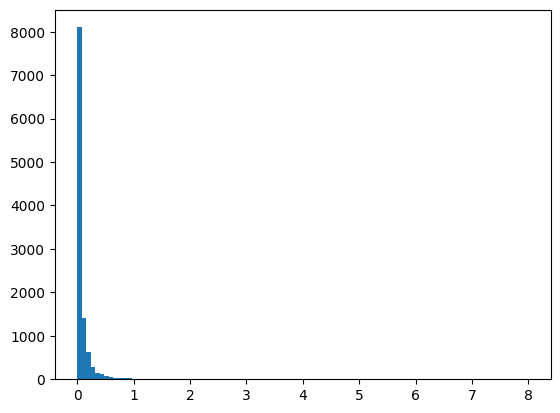

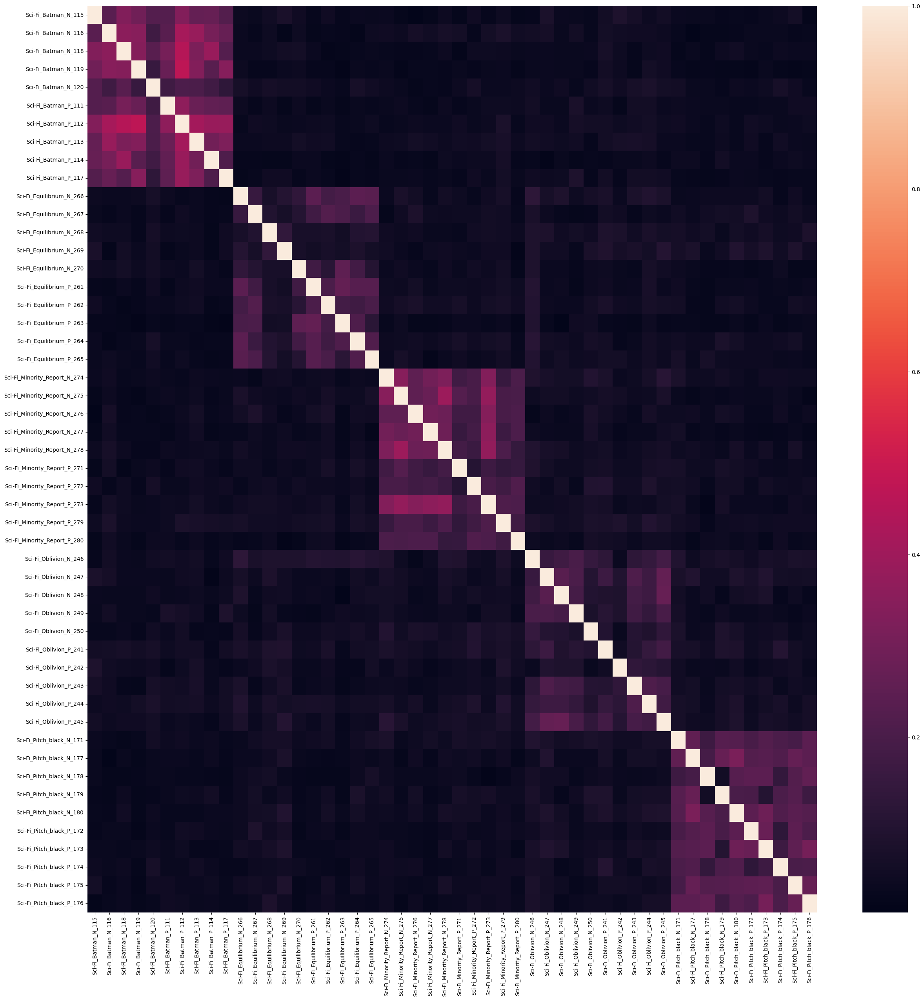

,aaron,ab,abandon,abandoned,abandoning,abdicating,abducted,abduction,abela,aberration,...,zoe,zoetrope,zohan,zombie,zone,zoning,zoologist,zoom,is_equilibrium,is_scifi
Doc_ID,,,,,,,,,,,,,,,,,,,,,
291,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
293,4.11,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
294,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
299,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
300,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172,0.00,0.00,0.00,4.22,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,True
173,0.00,0.00,0.00,4.22,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.20,False,True
174,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,True


In [187]:
run_tfidf(documents, clean_method, important_prevalent_terms, 'TFIDF_exp')

In [189]:
# run_tfidf for candidate terms

def run_tfidf_candidate(documents: List[Document],
              clean_func: Callable[[List[Document]], List[TokenizedDocument]],
              important_prevalent_terms: List[str],
              experiment_name: str,
              output_tfidf_vectors: bool=False,
              output_vocabulary: bool=True,
              plot_scifi_heatmap: bool=True) -> pd.DataFrame:
    cleaned_documents = clean_func(documents)
    cleaned_document_text = [' '.join(x.tokens) for x in cleaned_documents]

    vectorizer = TfidfVectorizer(use_idf=True,
                                 ngram_range=(1, 1),
                                 norm=None)

    transformed_documents = vectorizer.fit_transform(cleaned_document_text)
    transformed_documents_as_array = transformed_documents.toarray()

    output_dir = f'output/{experiment_name}_Results'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    if output_tfidf_vectors:
        for counter, doc in enumerate(transformed_documents_as_array):
            tf_idf_tuples = list(zip(vectorizer.get_feature_names_out(), doc))
            one_doc_as_df = (pd.DataFrame.from_records(tf_idf_tuples, columns=['term', 'score'])
                                .sort_values(by='score', ascending=False)
                                .reset_index(drop=True))
            one_doc_as_df.to_csv(f'{output_dir}/{corpus_df["Submission File Name"][counter]}')

    if output_vocabulary:
        with open(f'{output_dir}/vocabulary.txt', 'w') as vocab:
            words = sorted(vectorizer.get_feature_names_out())
            print('\n'.join(words), file=vocab)

    # document-term dataframe
    doc_term_matrix = transformed_documents.todense()
    doc_term_df = pd.DataFrame(doc_term_matrix,
                               columns=vectorizer.get_feature_names_out(),
                               index=corpus_df.Doc_ID)
    add_flags(doc_term_df, equilibrium_doc_ids, scifi_doc_ids)

    # ============================
    # Mean TF-IDF for candidate terms (replaces "top-10" block)
    # ============================
    # Use your provided candidate terms; lower-case to match vectorizer
    candidate_terms = [
        'action', 'feeling', 'world', 'soldiers', 'futuristic', 'emotion',
        'matrix', 'berlin', 'orwell', 'preston', 'direction', 'bale',
        'future', 'equilibrium'
    ]
    cand = [t.lower() for t in candidate_terms if t.lower() in doc_term_df.columns]

    if len(cand) == 0:
        print("None of the candidate terms are in the TF-IDF vocabulary. "
              "Check preprocessing, stop-words, and ngram_range.")
        mean_tfidf_candidates = pd.DataFrame()
    else:
        mean_tfidf_candidates = (
            pd.DataFrame(doc_term_df[cand].mean().round(4), columns=['Mean TF-IDF'])
            .sort_values('Mean TF-IDF', ascending=False)
        )
        display(mean_tfidf_candidates)

        # (Optional) group means if you want them; comment out if not needed
        mean_tfidf_candidates['Equilibrium (mean)'] = doc_term_df.loc[doc_term_df.is_equilibrium, cand].mean().round(4).reindex(mean_tfidf_candidates.index)
        mean_tfidf_candidates['All Sci-Fi (mean)'] = doc_term_df.loc[doc_term_df.is_scifi, cand].mean().round(4).reindex(mean_tfidf_candidates.index)

        # Save candidate-term means
        mean_tfidf_candidates.to_csv(f'{output_dir}/mean_tfidf_candidates.csv')

    # Keep the histogram & vocab size print if useful
    plt.hist(doc_term_df.mean(), 100, range=(0, 8))
    print(f'Vocabulary size: {doc_term_df.shape[1]}')

    # keep original 50×50 scifi heatmap unless disabled
    if plot_scifi_heatmap:
        similarities = cosine_similarity(doc_term_df.loc[scifi_doc_ids], doc_term_df.loc[scifi_doc_ids])
        fig, ax = plt.subplots(figsize=(30, 30))
        labels = [descriptors_by_doc_ids[x.doc_id] for x in scifi_documents]
        sns.heatmap(ax=ax, data=similarities, xticklabels=labels, yticklabels=labels)
        # plt.savefig(f'figures/{experiment_name}_heatmap_documents.png')
        plt.show()

    # NEW: return the doc-term matrix for downstream visuals
    return doc_term_df

,Mean TF-IDF
action,1.38
world,0.99
emotion,0.82
preston,0.49
feeling,0.47
future,0.44
bale,0.38
direction,0.38
futuristic,0.38
equilibrium,0.36


Vocabulary size: 11015


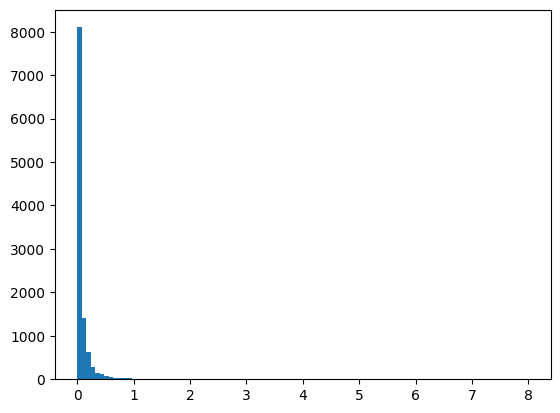

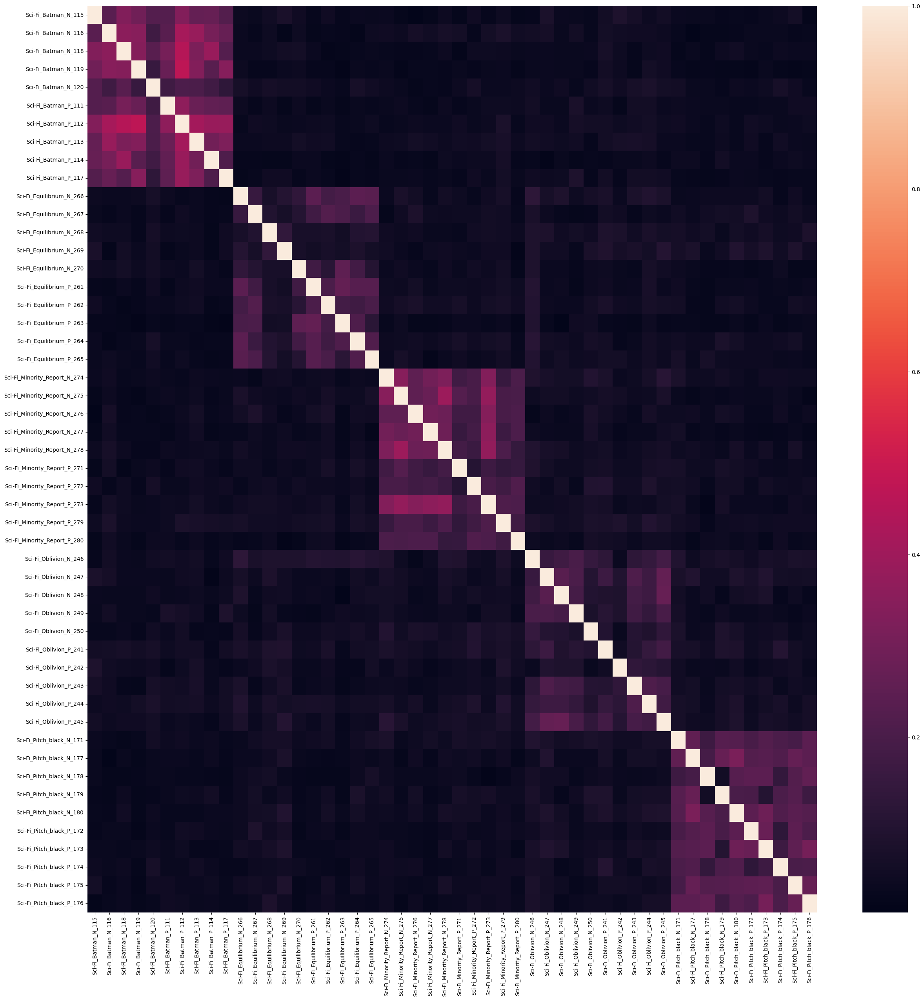

,aaron,ab,abandon,abandoned,abandoning,abdicating,abducted,abduction,abela,aberration,...,zoe,zoetrope,zohan,zombie,zone,zoning,zoologist,zoom,is_equilibrium,is_scifi
Doc_ID,,,,,,,,,,,,,,,,,,,,,
291,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
293,4.11,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
294,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
299,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
300,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172,0.00,0.00,0.00,4.22,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,True
173,0.00,0.00,0.00,4.22,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.20,False,True
174,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,True


In [190]:
run_tfidf_candidate(documents, clean_method, important_prevalent_terms, 'TFIDF_exp_candidate')

In [231]:
# run_tfidf for weak_candidate terms

def run_tfidf_weak_candidate(documents: List[Document],
              clean_func: Callable[[List[Document]], List[TokenizedDocument]],
              important_prevalent_terms: List[str],
              experiment_name: str,
              output_tfidf_vectors: bool=False,
              output_vocabulary: bool=True,
              plot_scifi_heatmap: bool=True) -> pd.DataFrame:
    cleaned_documents = clean_func(documents)
    cleaned_document_text = [' '.join(x.tokens) for x in cleaned_documents]

    vectorizer = TfidfVectorizer(use_idf=True,
                                 ngram_range=(1, 1),
                                 norm=None)

    transformed_documents = vectorizer.fit_transform(cleaned_document_text)
    transformed_documents_as_array = transformed_documents.toarray()

    output_dir = f'output/{experiment_name}_Results'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    if output_tfidf_vectors:
        for counter, doc in enumerate(transformed_documents_as_array):
            tf_idf_tuples = list(zip(vectorizer.get_feature_names_out(), doc))
            one_doc_as_df = (pd.DataFrame.from_records(tf_idf_tuples, columns=['term', 'score'])
                                .sort_values(by='score', ascending=False)
                                .reset_index(drop=True))
            one_doc_as_df.to_csv(f'{output_dir}/{corpus_df["Submission File Name"][counter]}')

    if output_vocabulary:
        with open(f'{output_dir}/vocabulary.txt', 'w') as vocab:
            words = sorted(vectorizer.get_feature_names_out())
            print('\n'.join(words), file=vocab)

    # document-term dataframe
    doc_term_matrix = transformed_documents.todense()
    doc_term_df = pd.DataFrame(doc_term_matrix,
                               columns=vectorizer.get_feature_names_out(),
                               index=corpus_df.Doc_ID)
    add_flags(doc_term_df, equilibrium_doc_ids, scifi_doc_ids)

    # ============================
    # Mean TF-IDF for candidate terms (replaces "top-10" block)
    # ============================
    # Use your provided candidate terms; lower-case to match vectorizer
    weak_candidate_terms = [
    'love',
    'nice',
    'pretty',
    'beautiful',
    'sad',
    'happy',
    'anger',
    'scared',
    'upset',
    'frustration',
    'disappointment']
    cand = [t.lower() for t in weak_candidate_terms if t.lower() in doc_term_df.columns]

    if len(cand) == 0:
        print("None of the candidate terms are in the TF-IDF vocabulary. "
              "Check preprocessing, stop-words, and ngram_range.")
        mean_tfidf_candidates = pd.DataFrame()
    else:
        mean_tfidf_candidates = (
            pd.DataFrame(doc_term_df[cand].mean().round(4), columns=['Mean TF-IDF'])
            .sort_values('Mean TF-IDF', ascending=False)
        )
        display(mean_tfidf_candidates)

        # (Optional) group means if you want them; comment out if not needed
        mean_tfidf_candidates['Equilibrium (mean)'] = doc_term_df.loc[doc_term_df.is_equilibrium, cand].mean().round(4).reindex(mean_tfidf_candidates.index)
        mean_tfidf_candidates['All Sci-Fi (mean)'] = doc_term_df.loc[doc_term_df.is_scifi, cand].mean().round(4).reindex(mean_tfidf_candidates.index)

        # Save candidate-term means
        mean_tfidf_candidates.to_csv(f'{output_dir}/mean_tfidf_candidates.csv')

    # Keep the histogram & vocab size print if useful
    plt.hist(doc_term_df.mean(), 100, range=(0, 8))
    print(f'Vocabulary size: {doc_term_df.shape[1]}')

    # keep original 50×50 scifi heatmap unless disabled
    if plot_scifi_heatmap:
        similarities = cosine_similarity(doc_term_df.loc[scifi_doc_ids], doc_term_df.loc[scifi_doc_ids])
        fig, ax = plt.subplots(figsize=(30, 30))
        labels = [descriptors_by_doc_ids[x.doc_id] for x in scifi_documents]
        sns.heatmap(ax=ax, data=similarities, xticklabels=labels, yticklabels=labels)
        # plt.savefig(f'figures/{experiment_name}_heatmap_documents.png')
        plt.show()

    # NEW: return the doc-term matrix for downstream visuals
    return doc_term_df

,Mean TF-IDF
love,0.70
pretty,0.51
nice,0.41
happy,0.23
sad,0.19
beautiful,0.15
disappointment,0.13
anger,0.07
frustration,0.07
upset,0.03


Vocabulary size: 11015


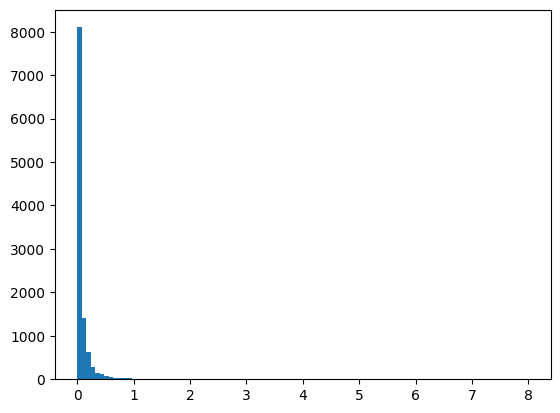

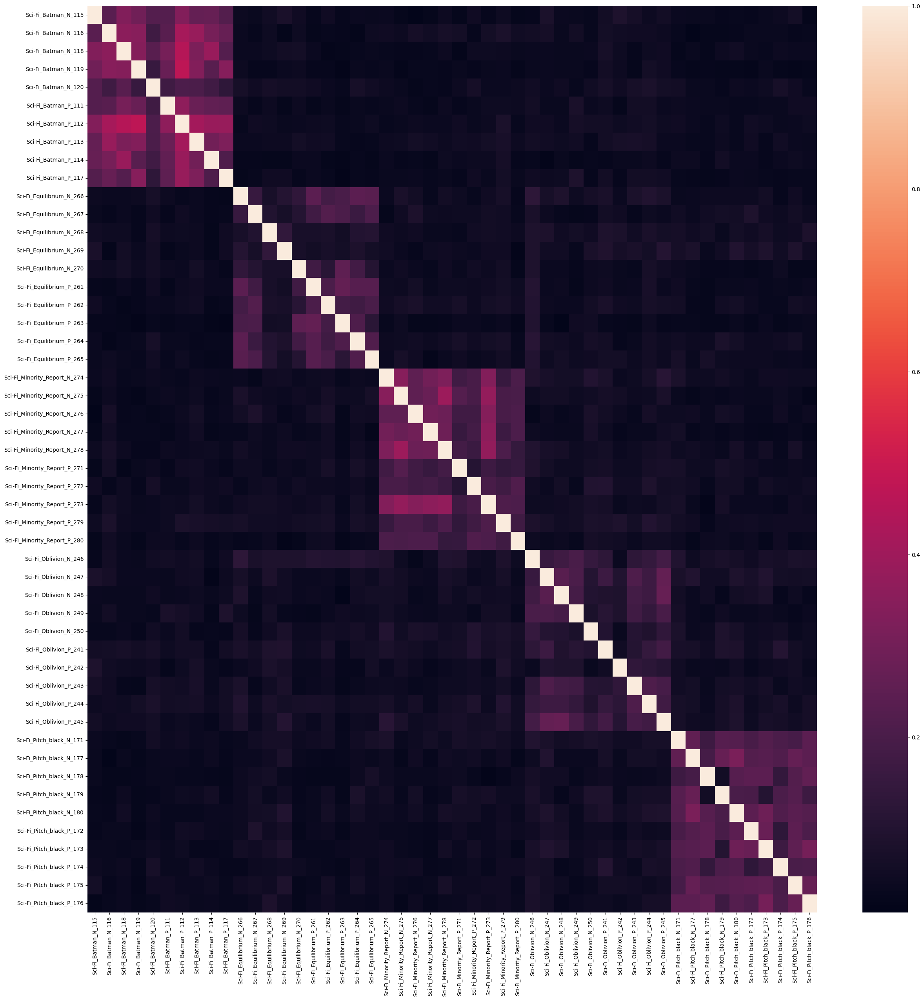

,aaron,ab,abandon,abandoned,abandoning,abdicating,abducted,abduction,abela,aberration,...,zoe,zoetrope,zohan,zombie,zone,zoning,zoologist,zoom,is_equilibrium,is_scifi
Doc_ID,,,,,,,,,,,,,,,,,,,,,
291,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
293,4.11,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
294,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
299,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
300,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172,0.00,0.00,0.00,4.22,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,True
173,0.00,0.00,0.00,4.22,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.20,False,True
174,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,True


In [232]:
run_tfidf_weak_candidate(documents, clean_method, important_prevalent_terms, 'TFIDF_exp_weak_candidate')

,Mean TF-IDF
like,2.28
one,2.26
barbie,2.23
time,1.94
character,1.88
annie,1.85
bond,1.64
girl,1.62
get,1.61
two,1.59


Vocabulary size: 11015


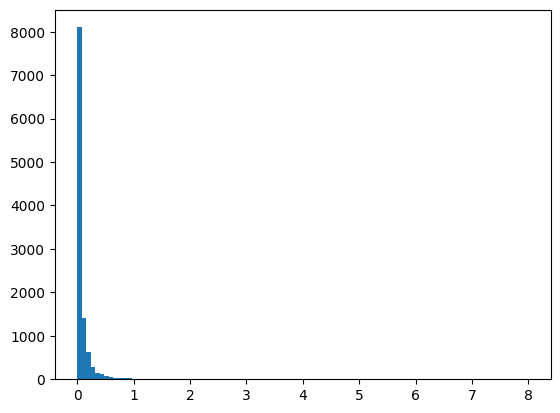

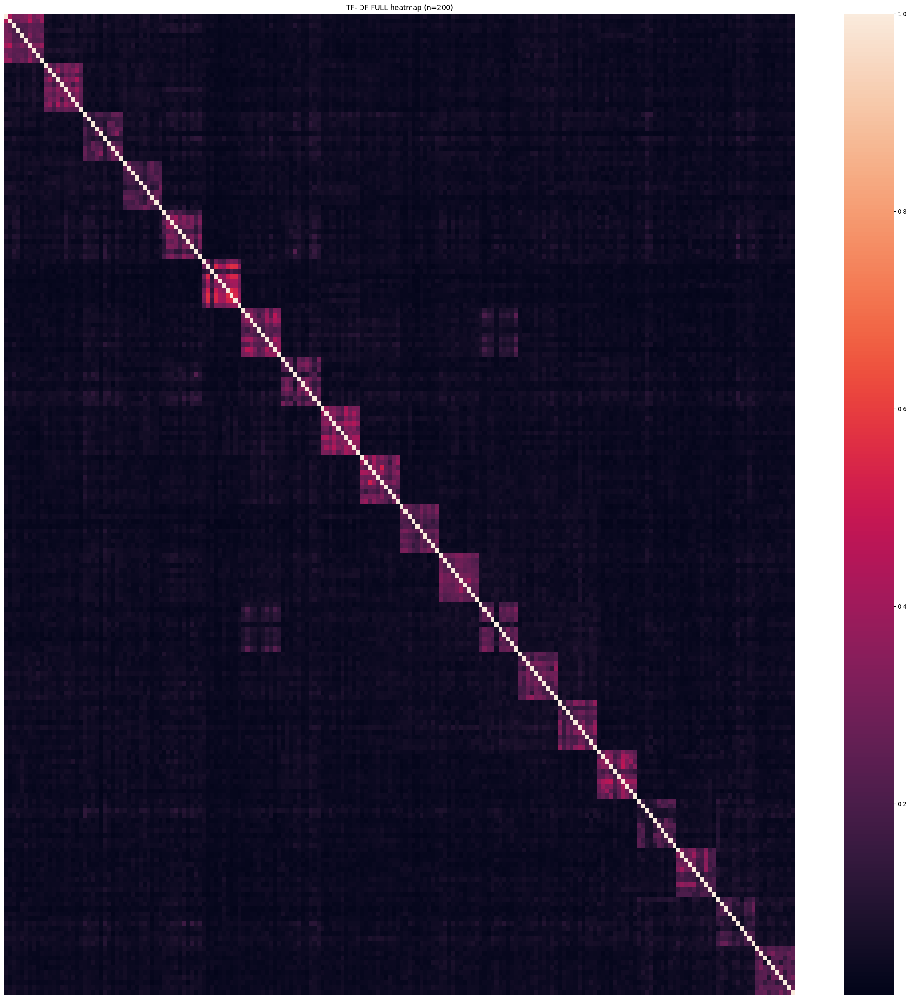

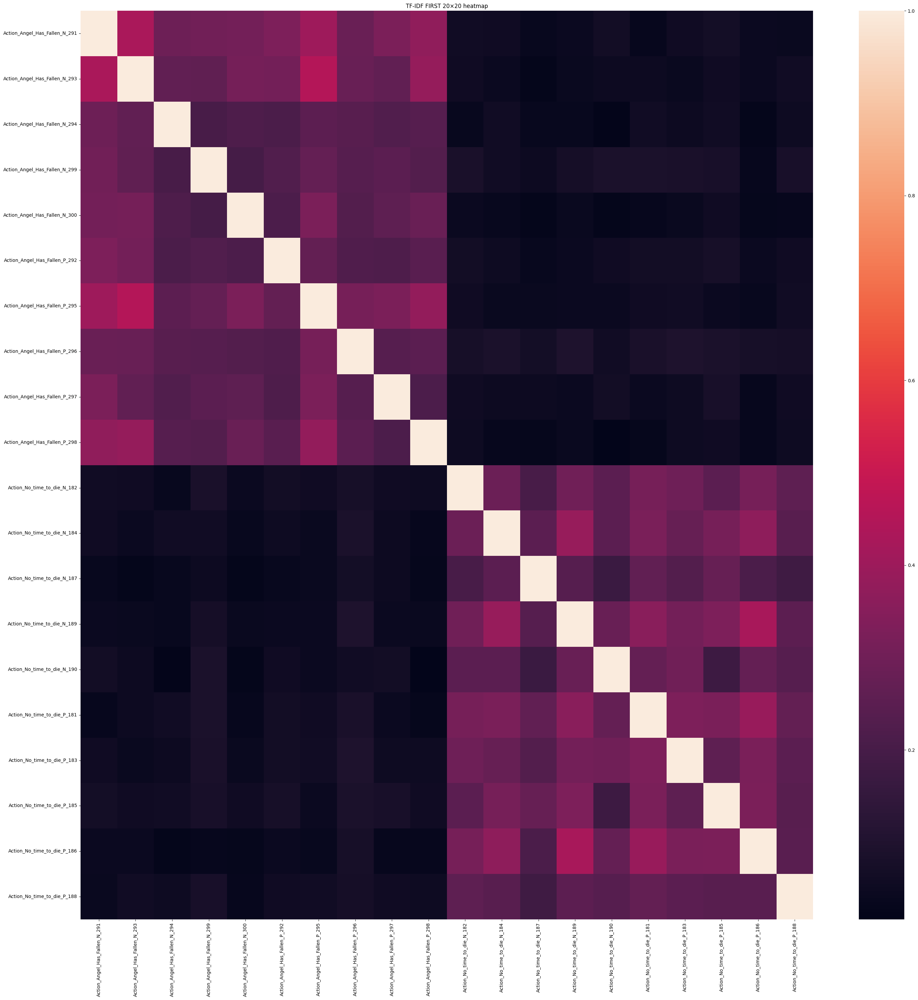

In [191]:
# NEW: Show full n x n (200 x 200) and 20 x 20 heatmap

# build once, suppress the internal 50×50 so we don’t double-plot
doc_term_df = run_tfidf(documents, clean_method, important_prevalent_terms, 'TFIDF_exp',
                        plot_scifi_heatmap=False)

# FULL n x n
full_sim = cosine_similarity(doc_term_df, doc_term_df)
fig, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(ax=ax, data=full_sim, xticklabels=False, yticklabels=False)
ax.set_title(f"TF-IDF FULL heatmap (n={doc_term_df.shape[0]})")
plt.show()

# FIRST 20 x FIRST 20
first_ids = list(doc_term_df.index)[:min(20, doc_term_df.shape[0])]
sub_sim = cosine_similarity(doc_term_df.loc[first_ids], doc_term_df.loc[first_ids])
labels_20 = [descriptors_by_doc_ids.get(doc_id, str(doc_id)) for doc_id in first_ids]

fig, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(ax=ax, data=sub_sim, xticklabels=labels_20, yticklabels=labels_20)
ax.set_title("TF-IDF FIRST 20×20 heatmap")
plt.xticks(rotation=90); plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

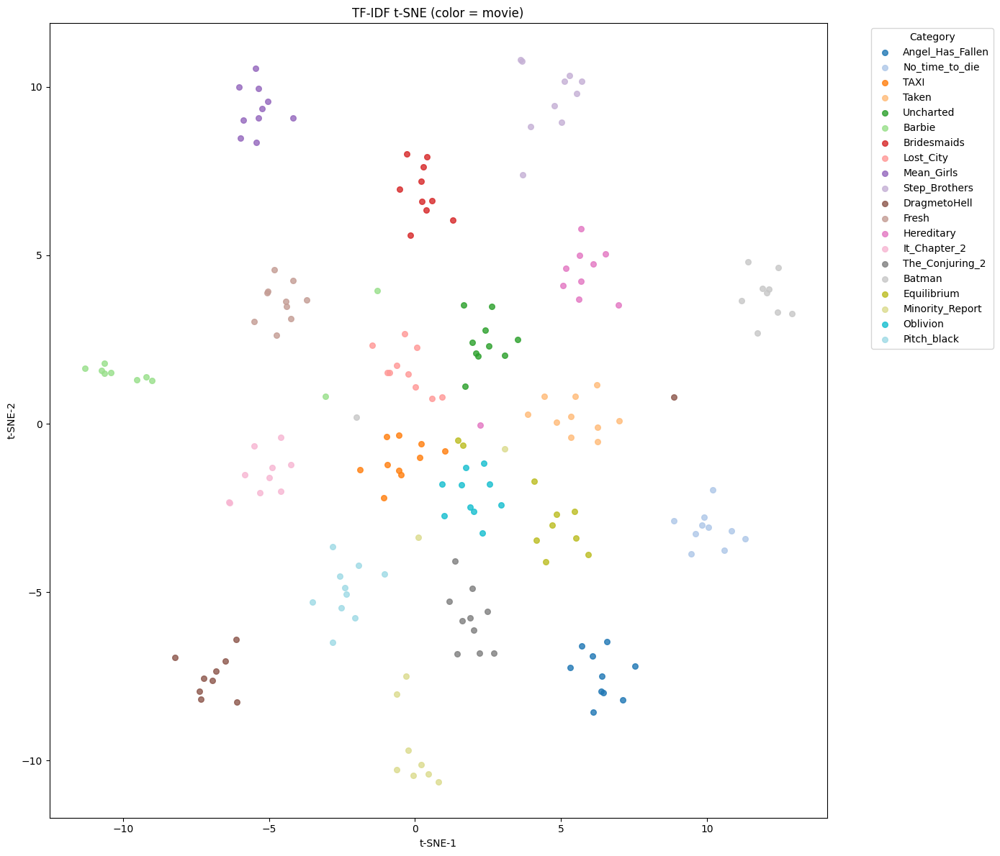

In [192]:
# NEW: t-SNE visualization for documents colored by movie

# tfidf_doc_df_for_tsne = doc_term_df.copy()
# movie_series = pd.Series({i: titles_by_doc_ids[i] for i in tfidf_doc_df_for_tsne.index})
# plot_tsne_by_category(tfidf_doc_df_for_tsne, movie_series, experiment_name="TFIDF_TSNE_by_movie")

tfidf_doc_df_for_tsne = doc_term_df.copy()  # rows=docs, cols=terms
movie_series = pd.Series({i: titles_by_doc_ids[i] for i in tfidf_doc_df_for_tsne.index})
unused_return_result= plot_tsne_by_category(tfidf_doc_df_for_tsne, movie_series, title="TF-IDF t-SNE (color = movie)")
# ^- unused_return_result prevents large array from being printed out in notebook

## Word2Vec

<div class="alert alert-block alert-success">
    <b>Word2vec embeddings</b>: https://radimrehurek.com/gensim/models/word2vec.html <br>
    This module implements the word2vec family of algorithms, using highly optimized C routines, data streaming and Pythonic interfaces.
            </div>

## Utility Functions For Word2Vec Experiments

In [193]:
def get_word2vec_vectors(documents: List[TokenizedDocument], embedding_size: int) -> pd.DataFrame:
    tokens = [x.tokens for x in documents]

    word2vec_model = Word2Vec(sentences=tokens, vector_size=embedding_size, window=3, min_count=1, workers=12)

    vectors = {}
    for i in word2vec_model.wv.index_to_key:
        temp_vec = word2vec_model.wv[i]
        vectors[i] = temp_vec

    result = pd.DataFrame(vectors).transpose()
    result = result.sort_index()
    return result

def plot_similarity_matrix(data: pd.DataFrame, experiment_name: str, figsize=(25, 25)):
    similarities = cosine_similarity(data, data)
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(ax=ax, data=similarities, xticklabels=data.index, yticklabels=data.index);
    #plt.savefig(f'figures/{experiment_name}_heatmap.png')
    plt.close()

def plot_similarity_clustermap(data: pd.DataFrame, experiment_name: str, figsize=(25, 25)):
    similarities = cosine_similarity(data, data)
    cm = sns.clustermap(similarities, metric='cosine', xticklabels=data.index, yticklabels=data.index, method='complete', cmap='RdBu', figsize=figsize)
    cm.ax_row_dendrogram.set_visible(False)
    cm.ax_col_dendrogram.set_visible(False)
    plt.legend(loc='upper left')
    #plt.savefig(f'figures/{experiment_name}_clustermap.png')
    plt.show()
    plt.close()

def plot_tsne(data: pd.DataFrame, perplexity: int, experiment_name: str, figsize=(40, 40)):
    """
    Creates a TSNE plot of the supplied dataframe
    """
    tsne_model = TSNE(perplexity=perplexity, n_components=2, learning_rate='auto', init='pca', n_iter=1000, random_state=32)
    new_values = tsne_model.fit_transform(data)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=figsize)
    labels = list(data.index)
    for i in range(len(x)):
        new_value = new_values[i]
        x = new_value[0]
        y = new_value[1]

        plt.scatter(x, y)
        plt.annotate(labels[i],
                     xy=(x, y),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    #plt.savefig(f'figures/{experiment_name}_tsne.png')
    plt.show()
    plt.close()

def run_word2vec_experiment(documents: List[Document],
                            clean_func: Callable[[List[Document]], List[TokenizedDocument]],
                            embedding_size: int,
                            chosen_tokens: List[str],
                            experiment_name: str):
    cleaned_documents = clean_func(documents)

    word2vec_df = get_word2vec_vectors(cleaned_documents, embedding_size)
    filtered_word2vec_df = word2vec_df.loc[chosen_tokens].copy()

    plot_tsne(filtered_word2vec_df, 30, experiment_name)
    plot_similarity_matrix(filtered_word2vec_df, experiment_name)
    plot_similarity_clustermap(filtered_word2vec_df, experiment_name)

In [194]:
from collections import Counter
import nltk

def _ensure_pos_tagger():
    try:
        nltk.pos_tag(["ok"])
    except LookupError:
        for res in ("averaged_perceptron_tagger_eng", "averaged_perceptron_tagger"):
            try:
                nltk.download(res, quiet=True)
                nltk.pos_tag(["ok"])
                break
            except Exception:
                pass

def select_tokens_for_word2vec(strategy: str = "most_common", top_k: int = 50):
    """
    Simple control flow, single return.
    - Always count tokens exactly as Word2Vec sees them (clean_method).
    - For 'nouns'/'verbs', filter those counts via POS, aligned to your W2V token form.
    """
    strategy = strategy.lower()

    # Count tokens in the exact form used by Word2Vec
    cleaned = clean_method(documents)  # List[TokenizedDocument]
    w2v_tokens = [tok for d in cleaned for tok in d.tokens]
    counts = Counter(w2v_tokens)

    # Decide what to include
    if strategy == "most_common":
        # No filtering; use all tokens and rank by frequency
        filtered = list(counts.items())

    elif strategy in ("nouns", "verbs"):
        _ensure_pos_tagger()

        # Flatten all tokens for tagging; keep words longer than 2 chars
        raw_tokens = [w for td in tokenize_documents(normalize_documents(documents)) for w in td.tokens if len(w) > 2]
        # ^ flattens token lists from all docs into one list; filters out super-short strings

        # Pick POS family
        if strategy == "nouns":
            want = "NN"  # matches NN, NNS, NNP, NNPS
        else:
            want = "VB"  # matches VB, VBD, VBG, VBN, VBP, VBZ

        tagged = nltk.pos_tag(raw_tokens)
        pos_kept = [w for (w, tag) in tagged if tag.startswith(want)]
        # ^ keeps only words whose POS tag starts with the wanted prefix

        # Align POS-selected words to your W2V token form (lemmatize -> stem)
        aligned_doc = stem(lemmatize([TokenizedDocument(-1, pos_kept)]))[0]
        allowed_tokens = aligned_doc.tokens

        # Keep only counted tokens that appear in the allowed list
        filtered = [(t, c) for (t, c) in counts.items() if t in allowed_tokens]

    else:
        raise ValueError("strategy must be 'most_common', 'nouns', or 'verbs'")

    # Rank and take top_k
    filtered.sort(key=lambda x: x[1], reverse=True)
    tokens = [t for t, _ in filtered[:top_k]]
    # ^ extracts just the token strings from the (token, count) pairs
    return tokens

In [195]:
# NEW

TOP_K = 100 # number of tokens to print for these heat map and t-SNE charts

tokens_most_common = select_tokens_for_word2vec("most_common", TOP_K)
print(f"most_common: selected {len(tokens_most_common)} tokens -> {tokens_most_common[:10]}")

tokens_nouns = select_tokens_for_word2vec("nouns", TOP_K)
print(f"nouns: selected {len(tokens_nouns)} tokens -> {tokens_nouns[:10]}")

tokens_verbs = select_tokens_for_word2vec("verbs", TOP_K)
print(f"verbs: selected {len(tokens_verbs)} tokens -> {tokens_verbs[:10]}")

most_common: selected 100 tokens -> ['one', 'like', 'time', 'character', 'get', 'two', 'make', 'even', 'much', 'story']
nouns: selected 100 tokens -> ['one', 'like', 'time', 'character', 'get', 'make', 'even', 'year', 'well', 'action']
verbs: selected 100 tokens -> ['one', 'like', 'time', 'character', 'get', 'make', 'even', 'well', 'scene', 'good']


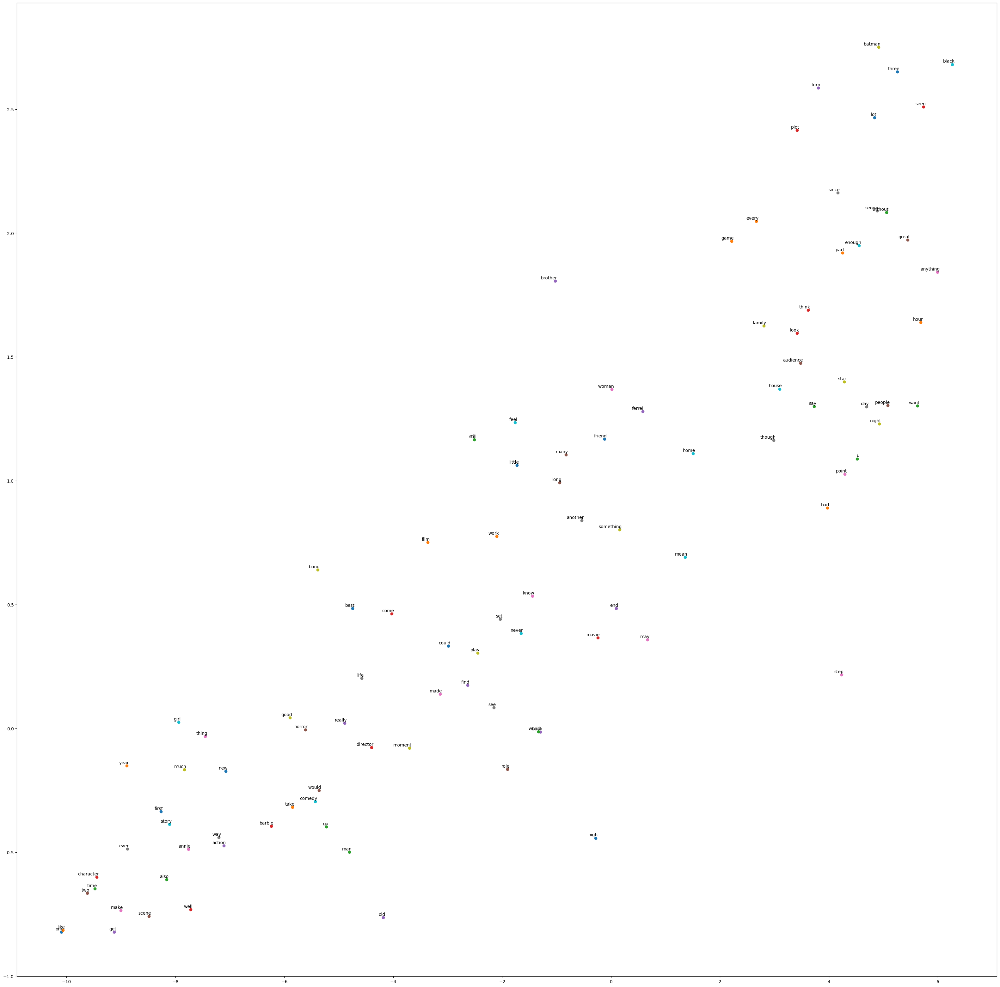

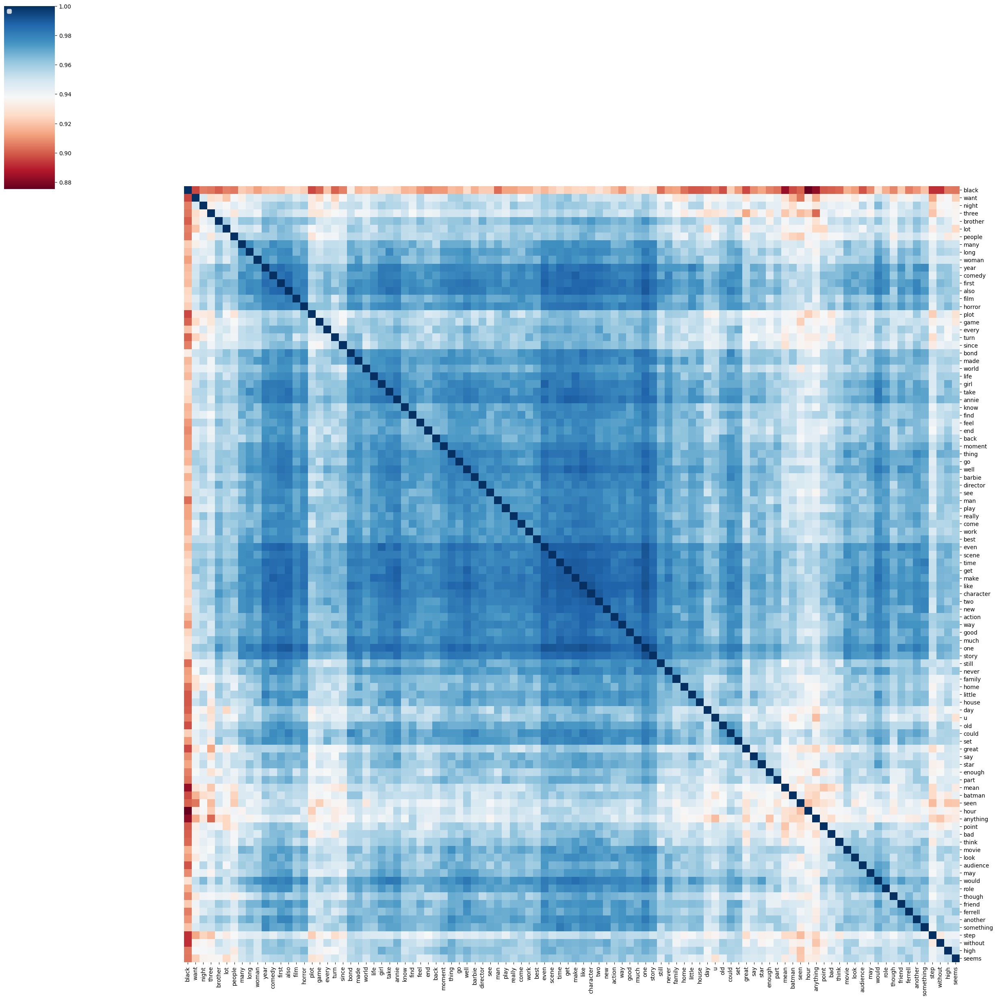

In [196]:
# NEW: Word2Vec visualizations using meaningful subsets of 100 tokens
# MOST COMMON, NOUNS, VERBS

# most_common
run_word2vec_experiment(documents, clean_method, 100, tokens_most_common, "W2V_most_common_100d")

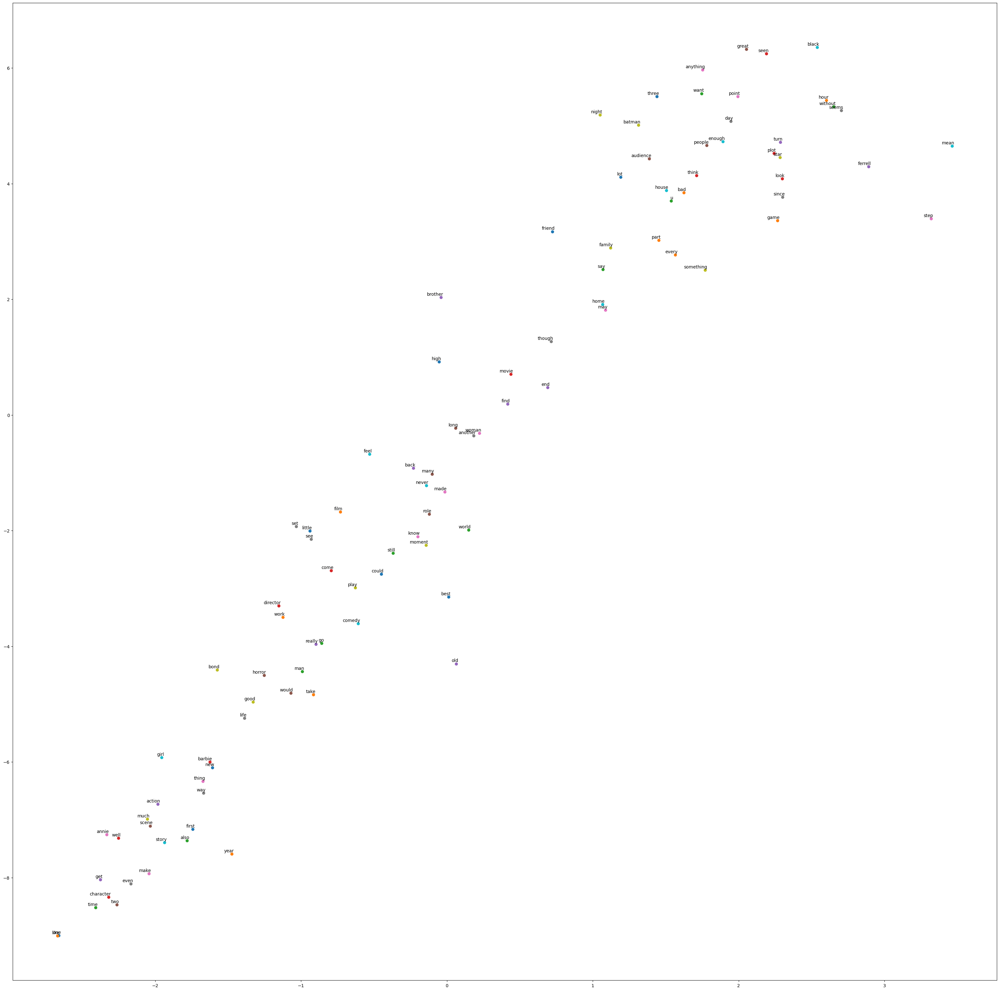

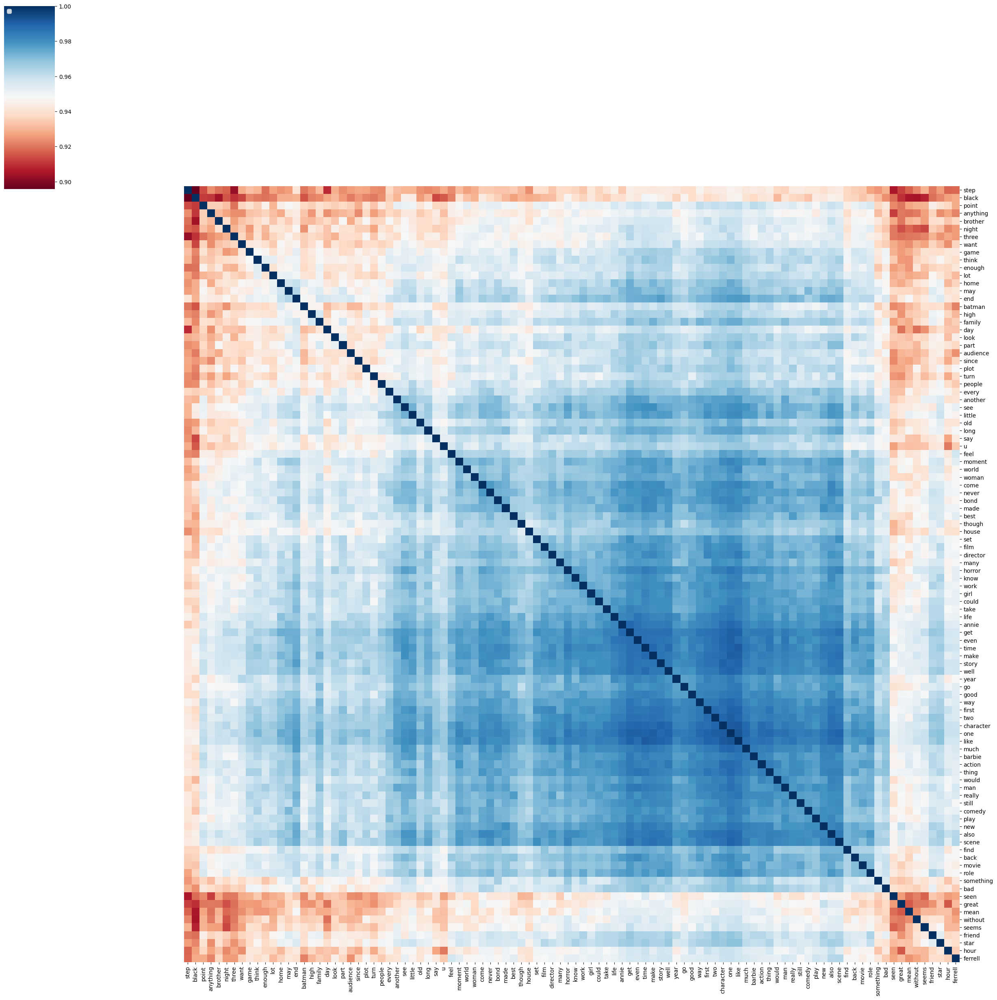

In [197]:
run_word2vec_experiment(documents, clean_method, 200, tokens_most_common, "W2V_most_common_200d")

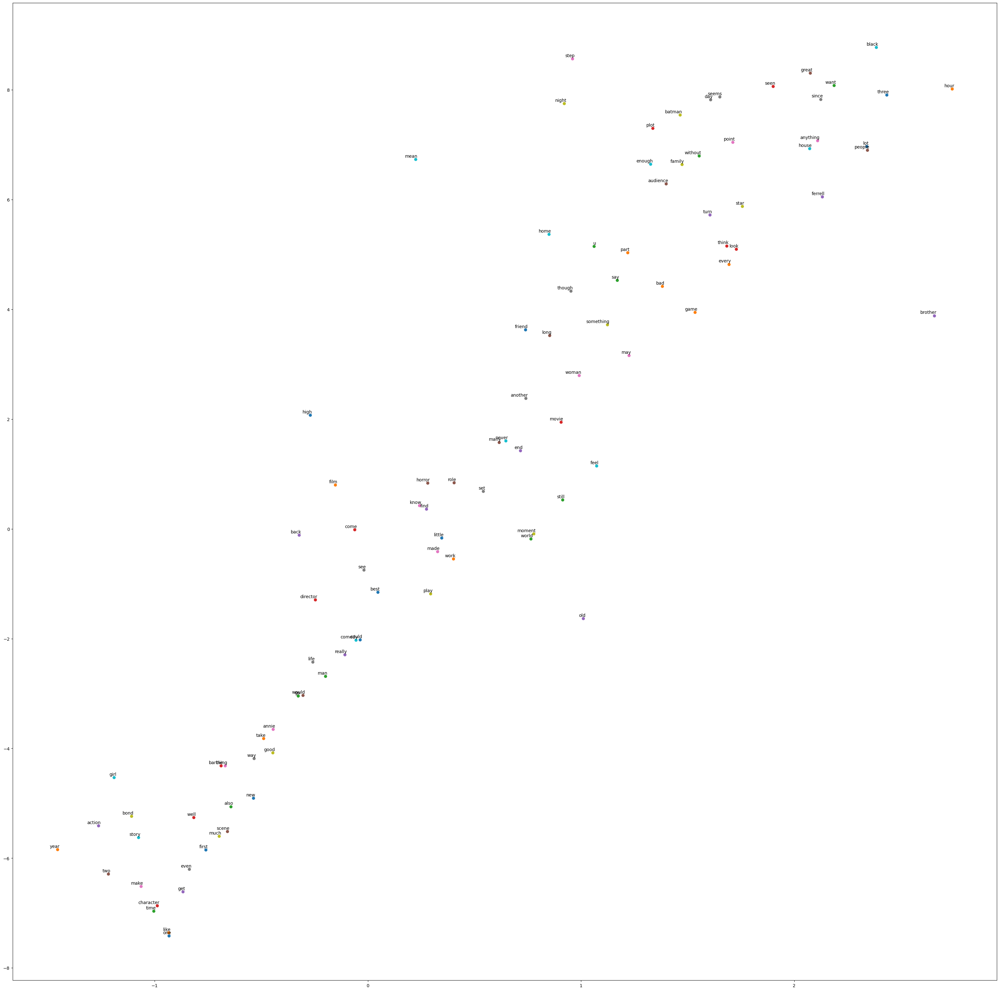

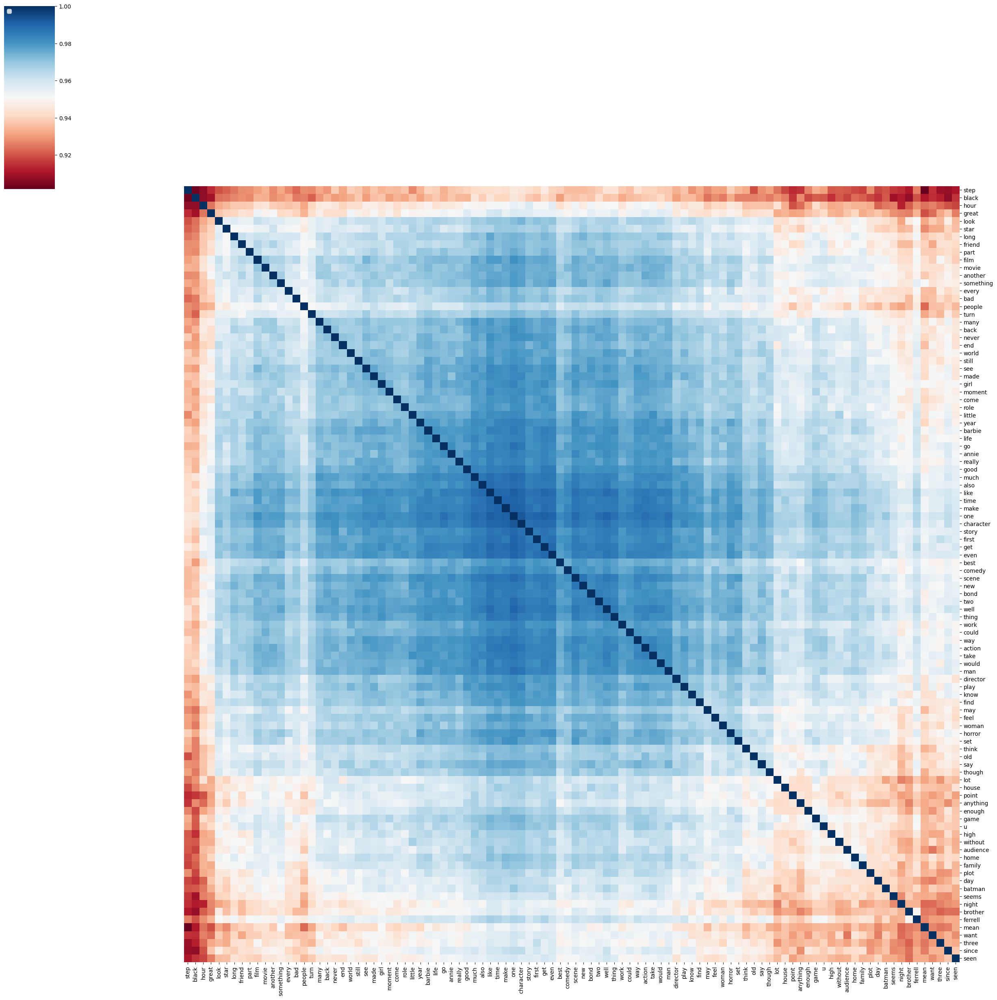

In [198]:
run_word2vec_experiment(documents, clean_method, 300, tokens_most_common, "W2V_most_common_300d")

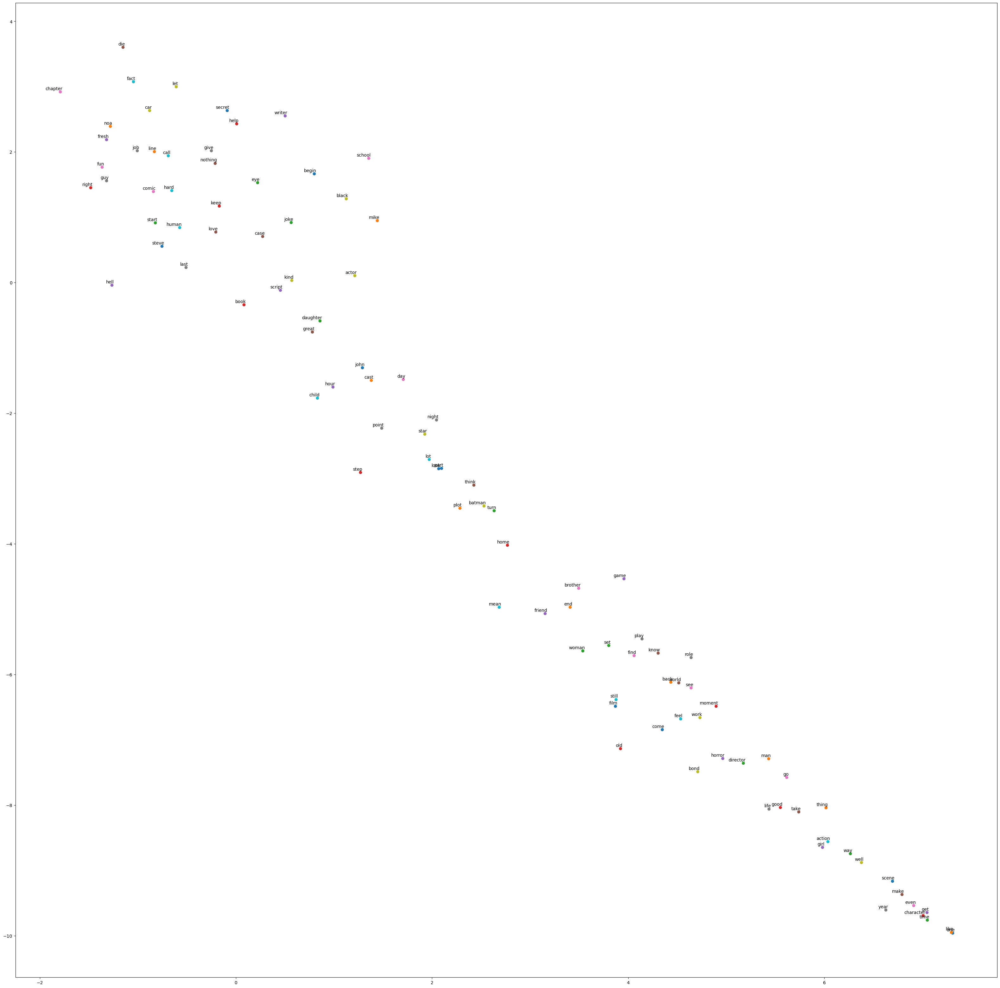

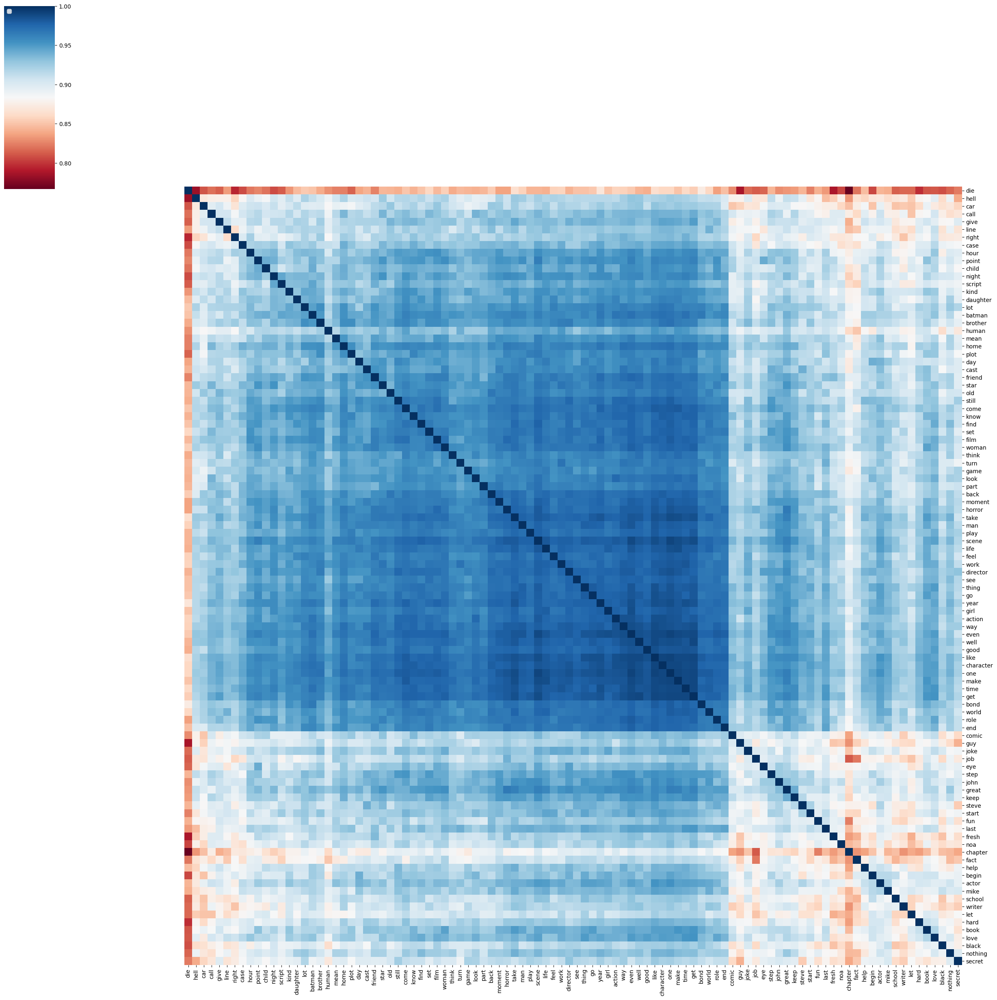

In [199]:
# nouns
run_word2vec_experiment(documents, clean_method, 100, tokens_nouns, "W2V_nouns_100d")

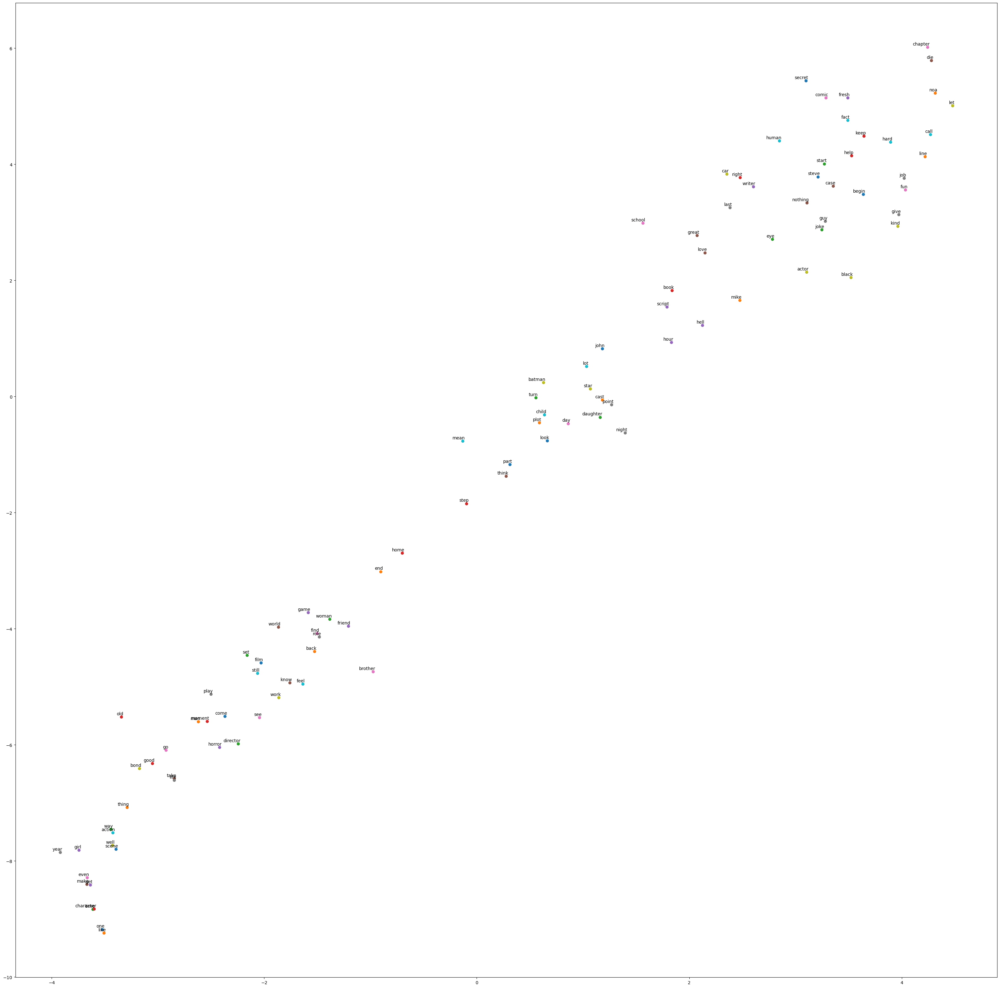

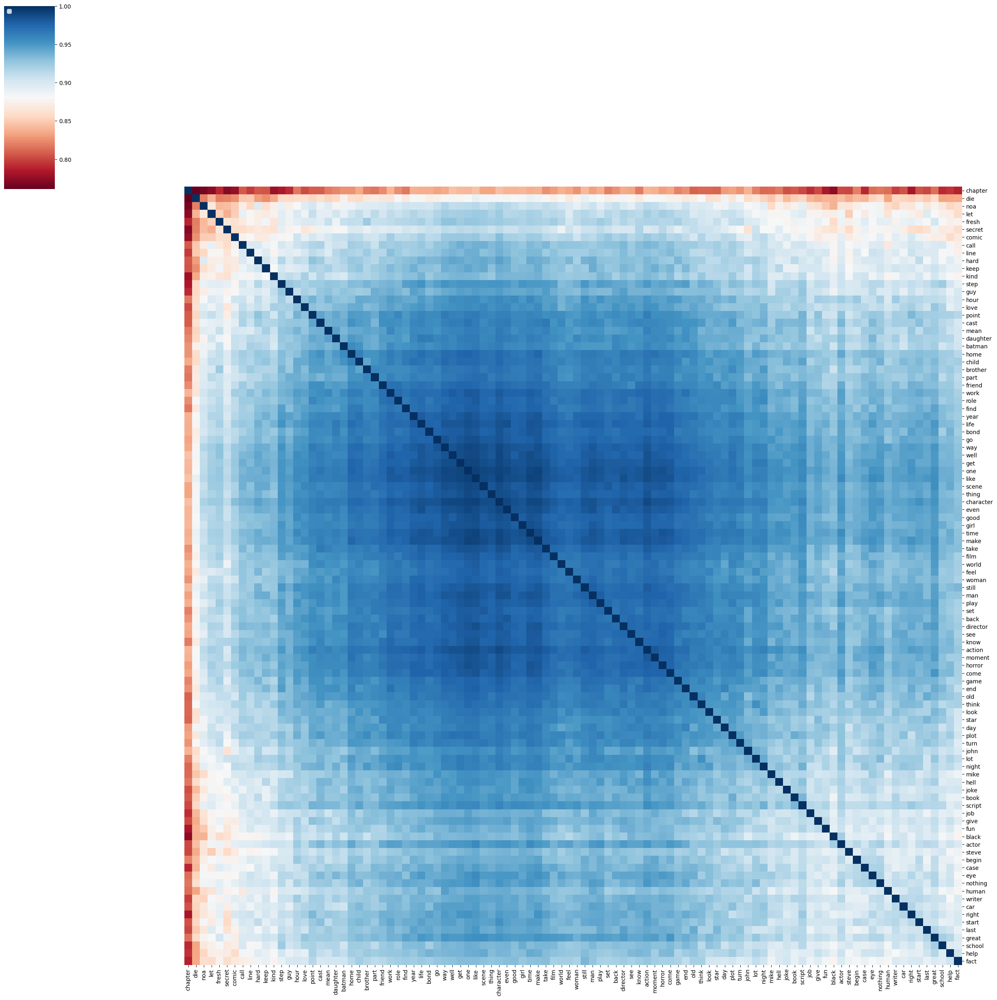

In [200]:
run_word2vec_experiment(documents, clean_method, 200, tokens_nouns, "W2V_nouns_200d")

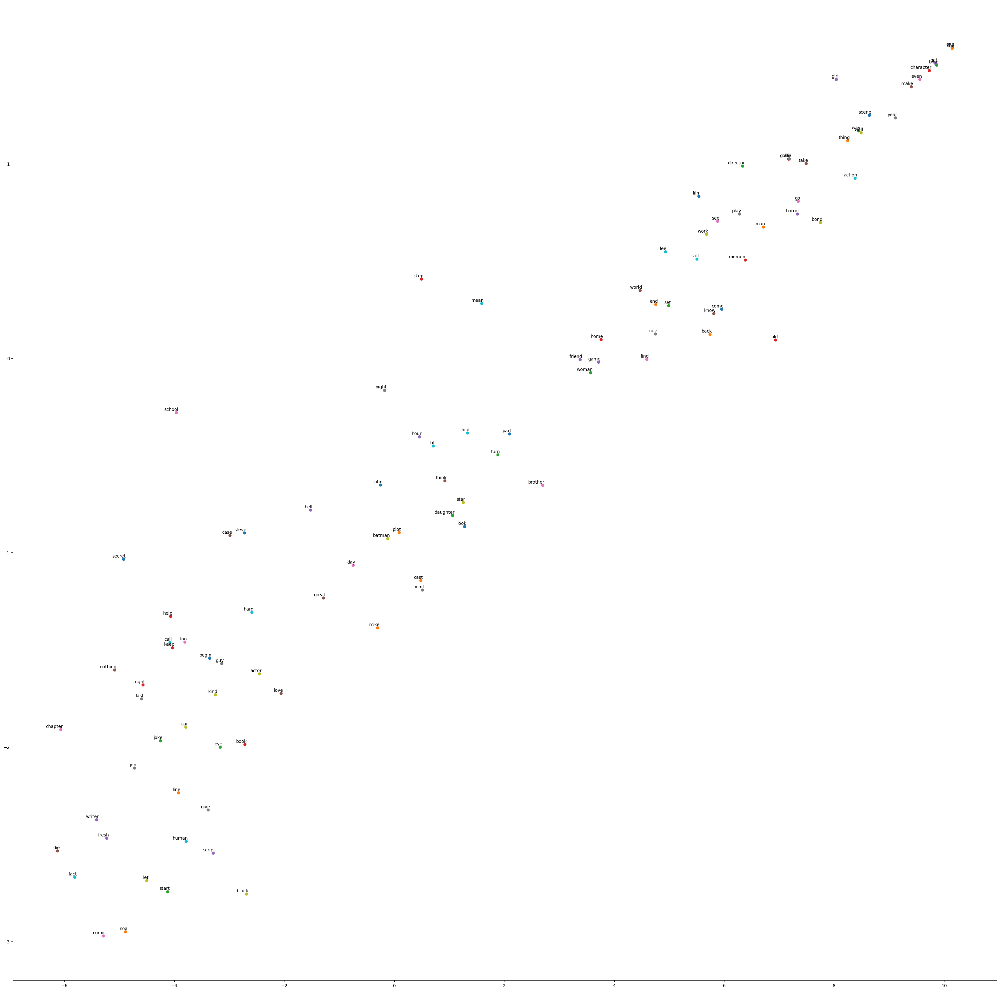

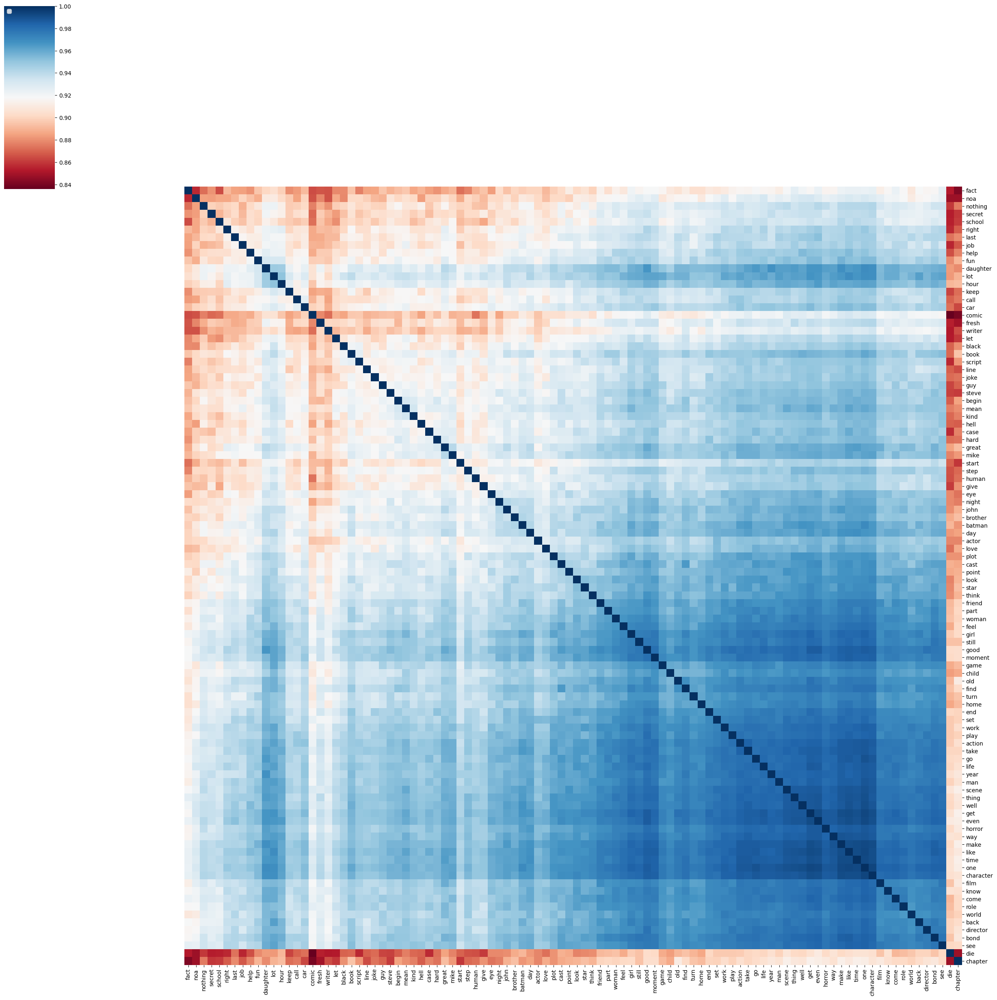

In [201]:
run_word2vec_experiment(documents, clean_method, 300, tokens_nouns, "W2V_nouns_300d")

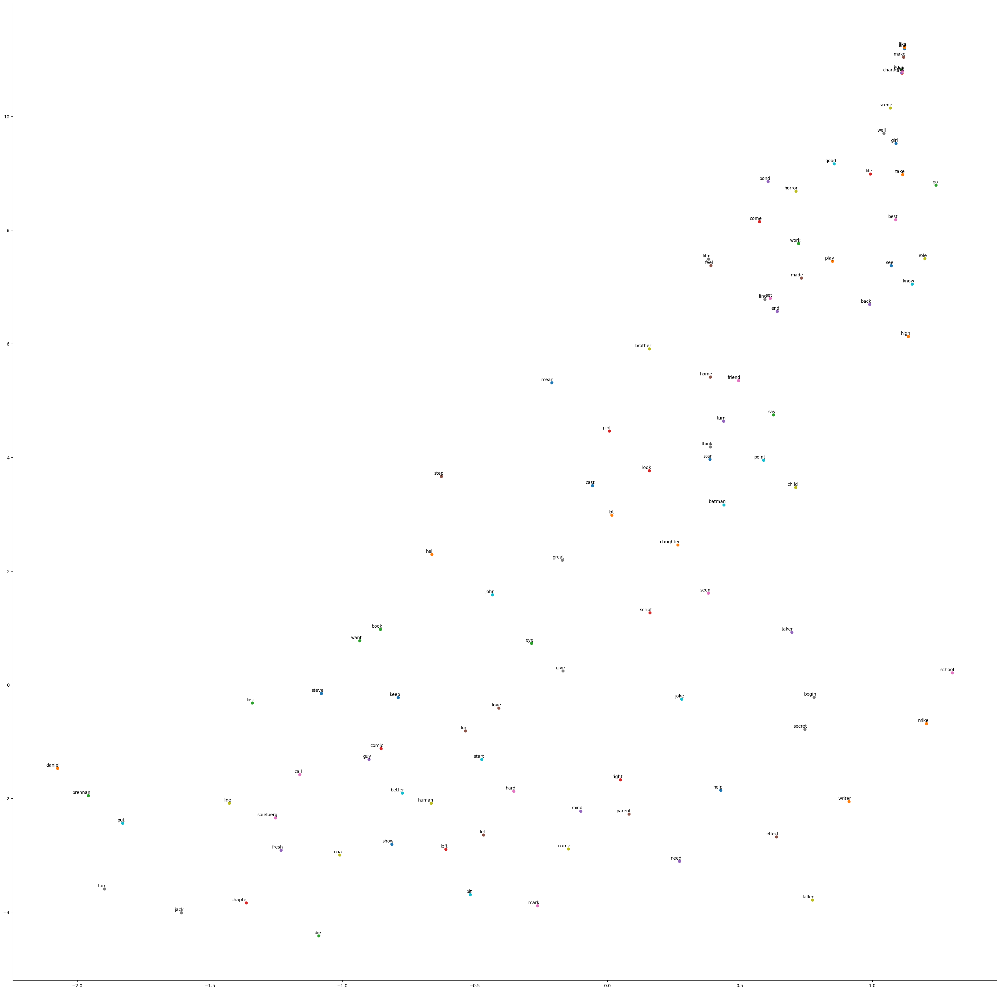

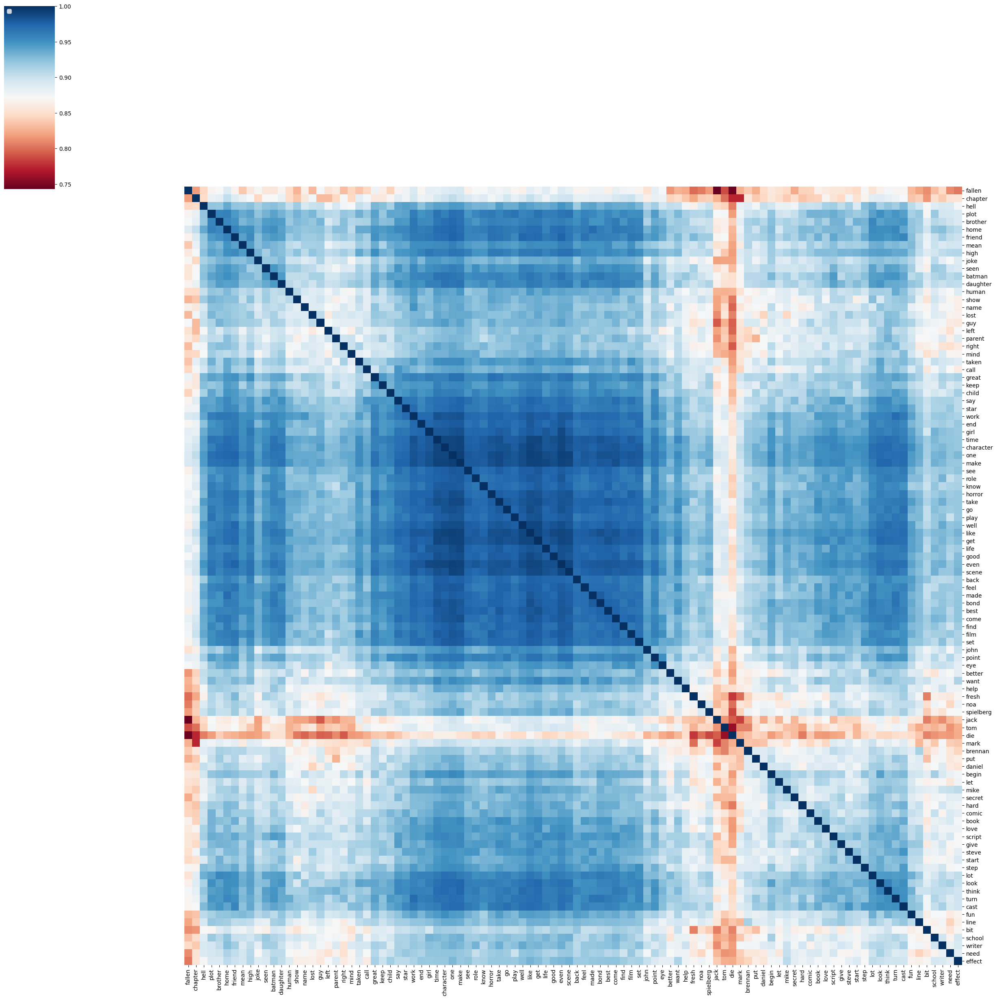

In [202]:
# verbs
run_word2vec_experiment(documents, clean_method, 100, tokens_verbs, "W2V_verbs_100d")

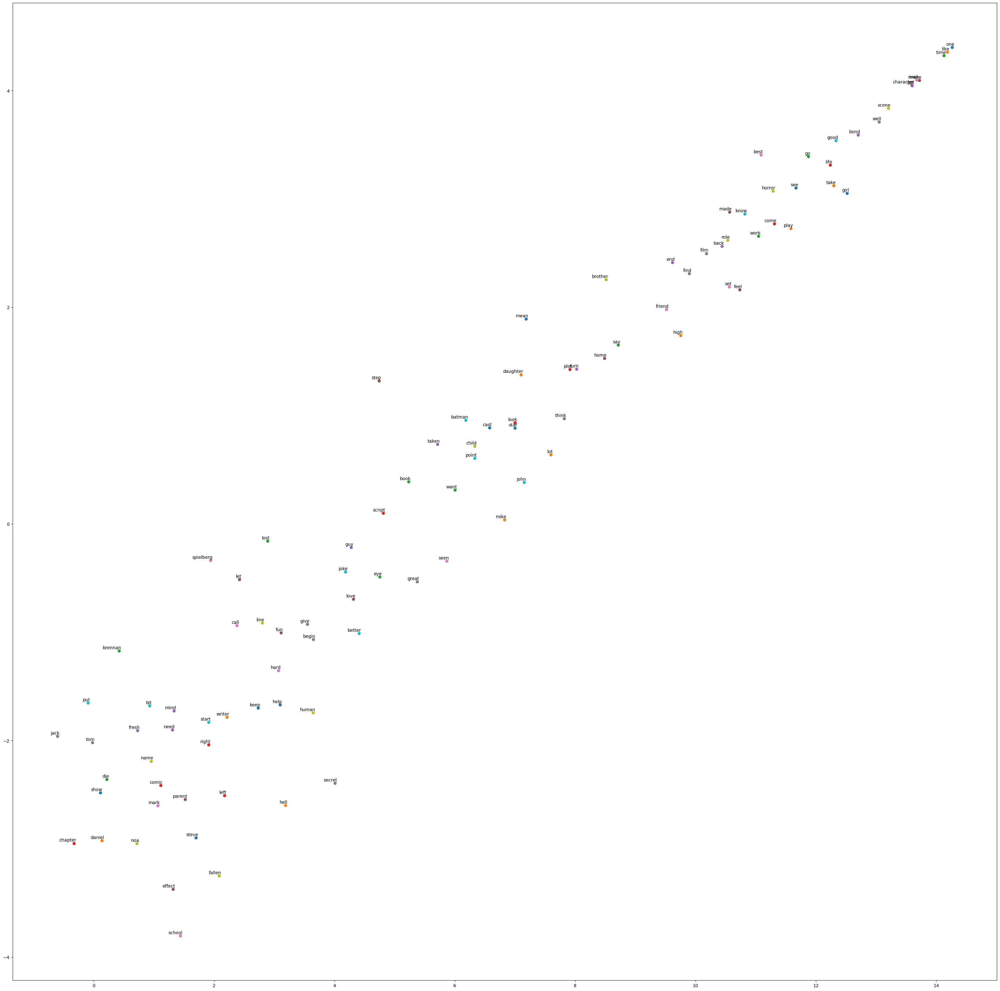

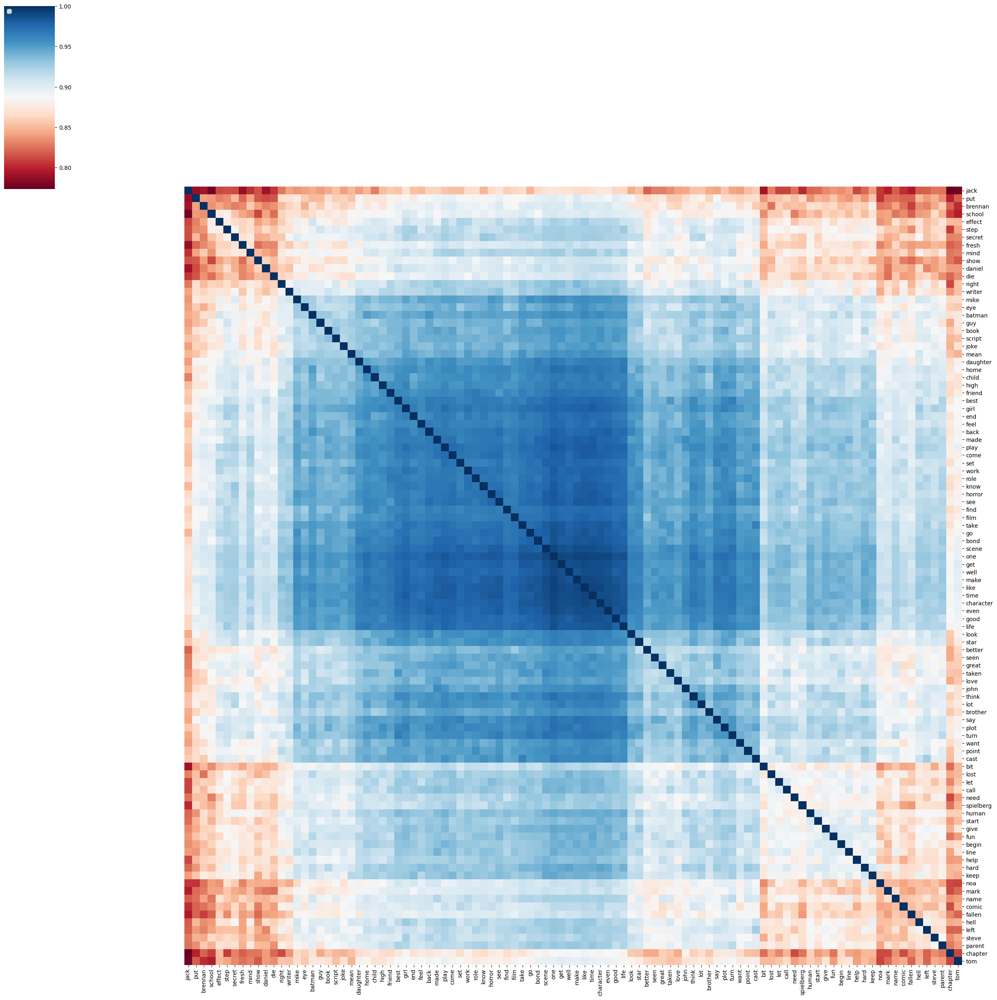

In [203]:
run_word2vec_experiment(documents, clean_method, 200, tokens_verbs, "W2V_verbs_200d")

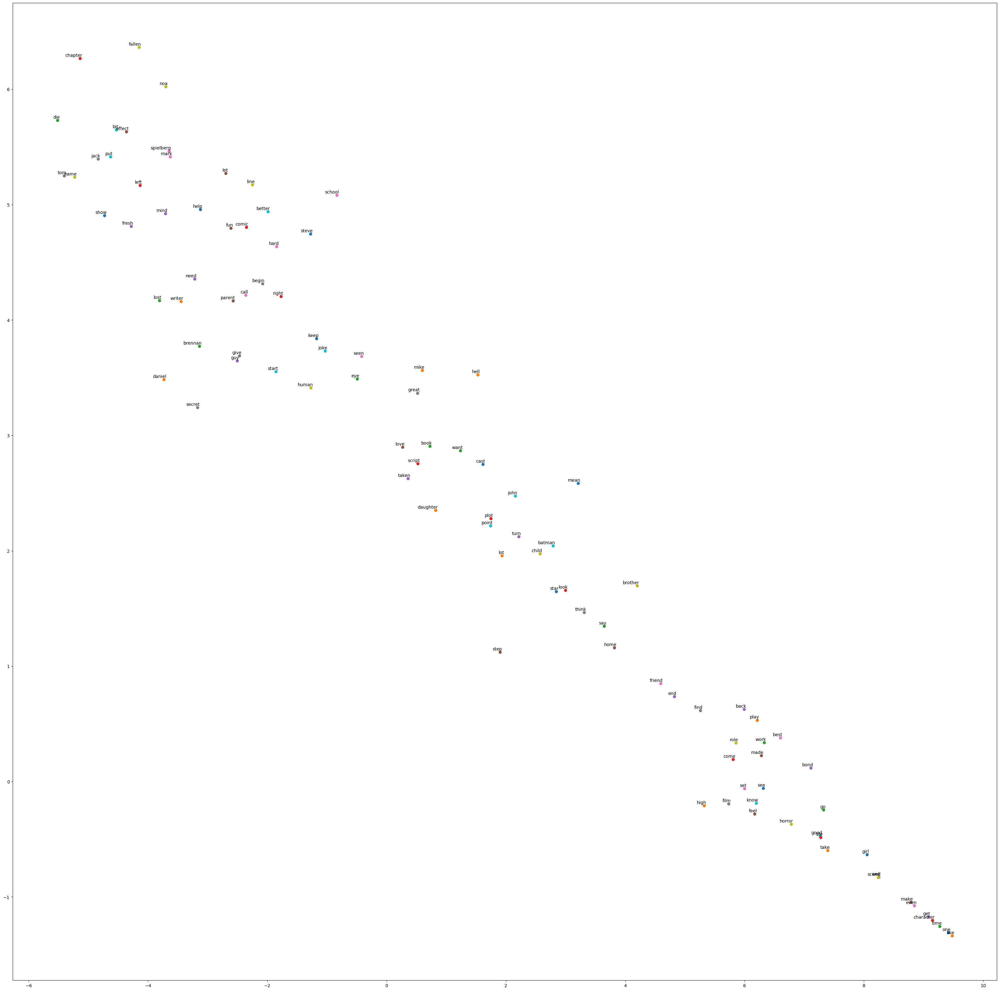

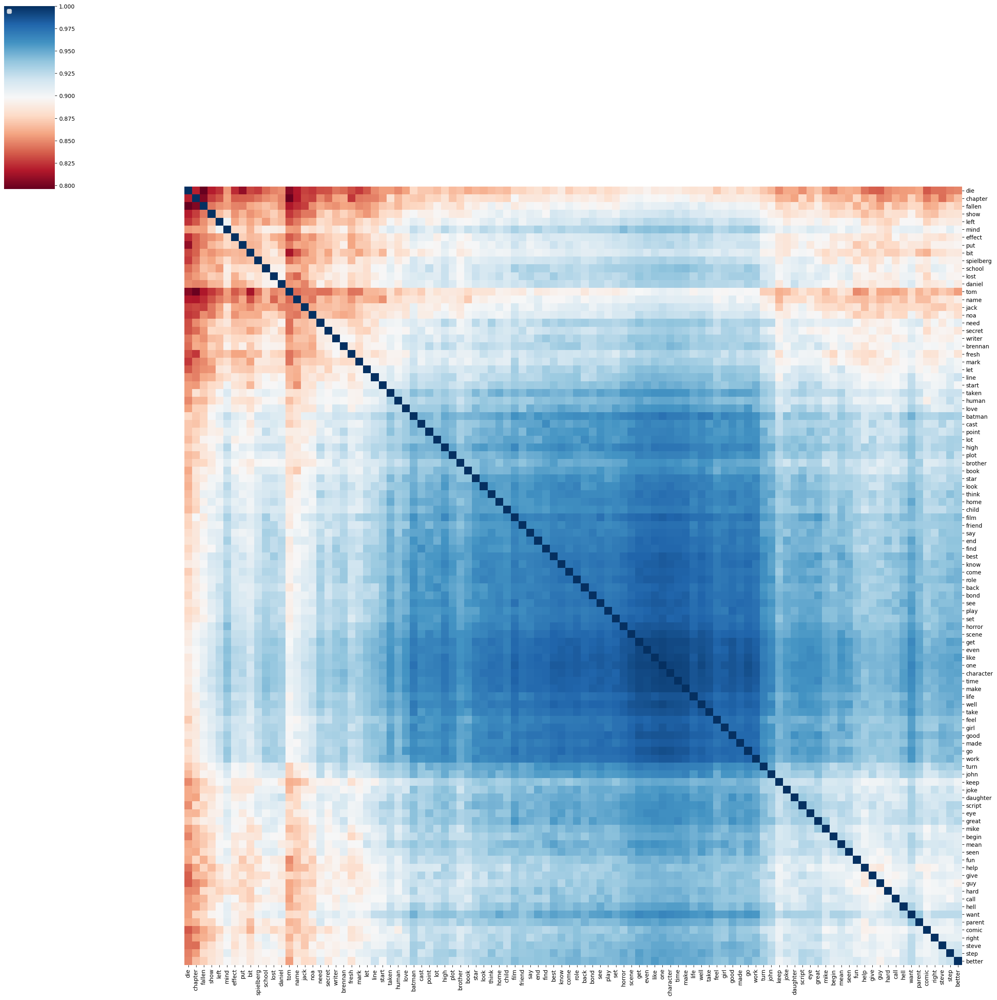

In [204]:
run_word2vec_experiment(documents, clean_method, 300, tokens_verbs, "W2V_verbs_300d")

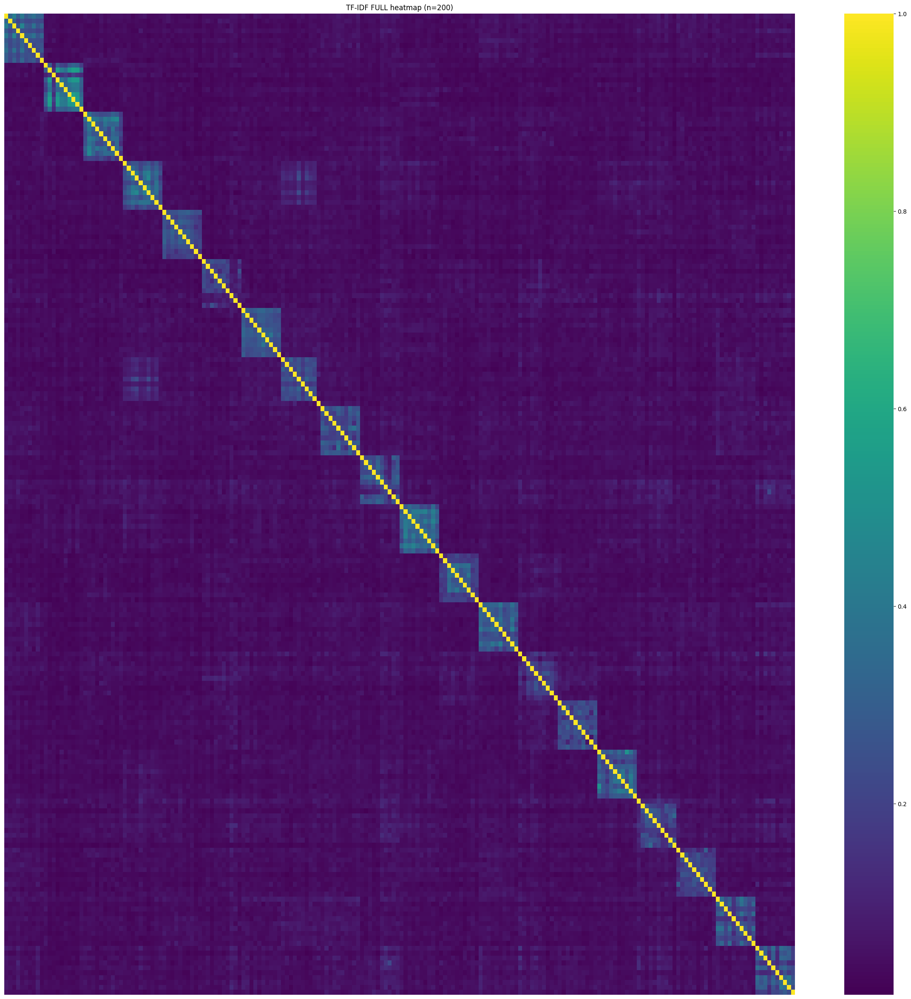

In [205]:
# NEW

# TF-IDF document–document heatmaps: FULL and SUBSET
# Place immediately after: run_tfidf(documents, clean_method, important_prevalent_terms, 'TFIDF_exp')

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

def _build_tfidf_doc_df(docs):
    """Rebuild TF-IDF doc-term matrix using your cleaning config; index = Doc_ID."""
    cleaned = clean_method(docs)
    texts = [' '.join(x.tokens) for x in cleaned]
    vec = TfidfVectorizer(use_idf=True, ngram_range=(1, 1), norm=None)
    X = vec.fit_transform(texts).toarray()
    doc_ids = [d.doc_id for d in cleaned]
    df = pd.DataFrame(X, index=doc_ids, columns=vec.get_feature_names_out())
    return df

def _order_by_movie_title(df):
    """Stable order by movie title so same-movie blocks appear along the diagonal."""
    order = sorted(df.index, key=lambda i: (titles_by_doc_ids[i], i))
    return df.loc[order]

def _subset_one_per_movie(df, n=20):
    """Pick at most one representative doc per movie (first occurrence in the ordered list)."""
    seen, keep = set(), []
    for i in df.index:
        t = titles_by_doc_ids[i]
        if t not in seen:
            keep.append(i)
            seen.add(t)
        if len(keep) >= n:
            break
    return df.loc[keep]

def plot_similarity_matrix_unlabeled(data: pd.DataFrame, title: str, figsize=(30, 30)):
    """Same idea as your plot_similarity_matrix, but without tick labels (professor request)."""
    sims = cosine_similarity(data, data)
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(ax=ax, data=sims, xticklabels=False, yticklabels=False, cmap='viridis')
    ax.set_title(title)
    plt.show()

# --- compute once, then plot both views ---
tfidf_doc_df = _order_by_movie_title(_build_tfidf_doc_df(documents))

# FULL n x n (no labels)
plot_similarity_matrix_unlabeled(tfidf_doc_df, title=f"TF-IDF FULL heatmap (n={len(tfidf_doc_df)})")

# SUBSET (labeled with Movie#DocID) using your existing labeled plotter
subset_df = _subset_one_per_movie(tfidf_doc_df, n=20)
subset_labeled = subset_df.copy()
subset_labeled.index = [f"{titles_by_doc_ids[i]}#{i}" for i in subset_df.index]

# Reuse existing labeled plot (plot_similarity_matrix expects rows=items, columns=features)
plot_similarity_matrix(subset_labeled, experiment_name="TFIDF_SUBSET_20", figsize=(14, 12))

In [206]:
extra_terms = [
    'dystopia',
    'drug',
    'control',
    'fight',
    'combat'
]

In [207]:
# Get our terms to examine in experiements 4-12
all_tokens = get_all_tokens(remove_stop_words(clean_method(documents)))
chosen_tokens = random.choices(all_tokens, k=100 - len(extra_terms)) + extra_terms

lemmatizer = WordNetLemmatizer()
lemmatized_chosen_tokens = [lemmatizer.lemmatize(x) for x in chosen_tokens]
stemmed_chosen_tokens = [stemmer.stem(x) for x in lemmatized_chosen_tokens]

## Word2Vec Experiments:


<div class="alert alert-block alert-success">
    <b>Word2vec embeddings</b>: https://radimrehurek.com/gensim/models/word2vec.html <br>
    This module implements the word2vec family of algorithms, using highly optimized C routines, data streaming and Pythonic interfaces.
            </div>

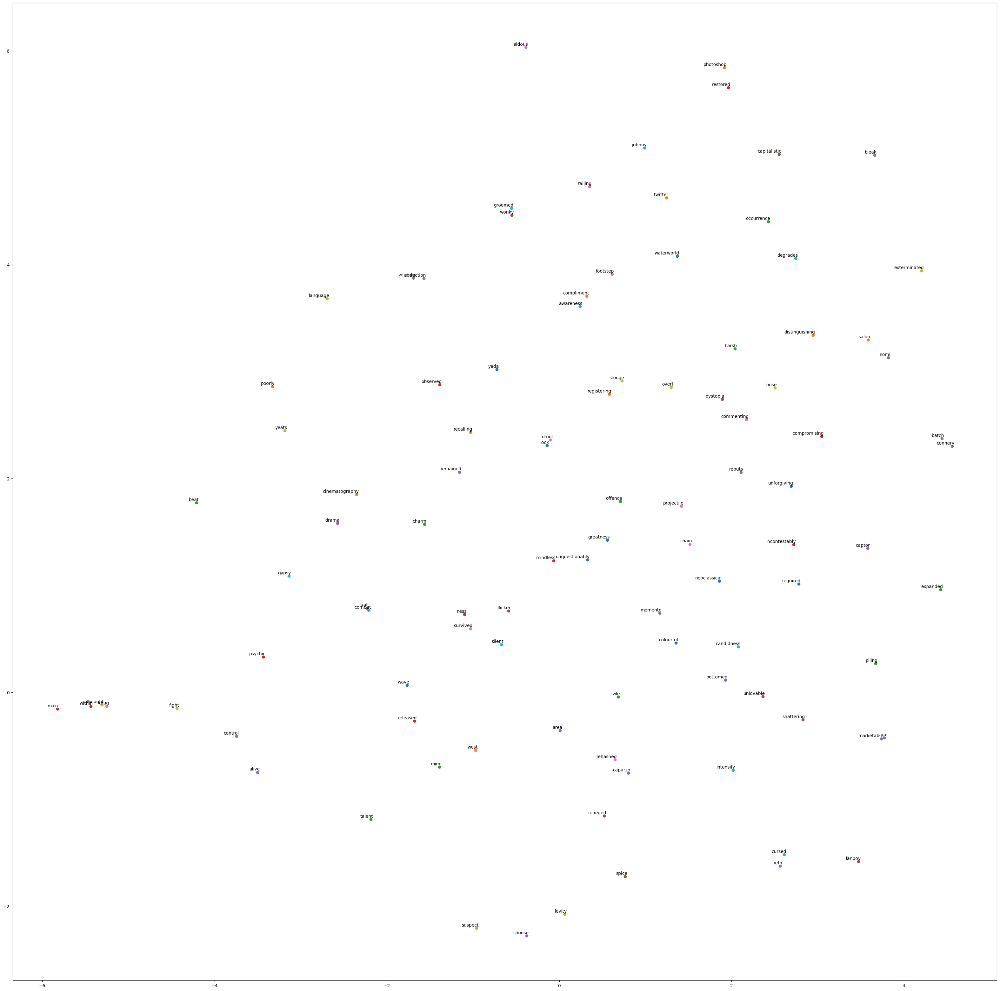

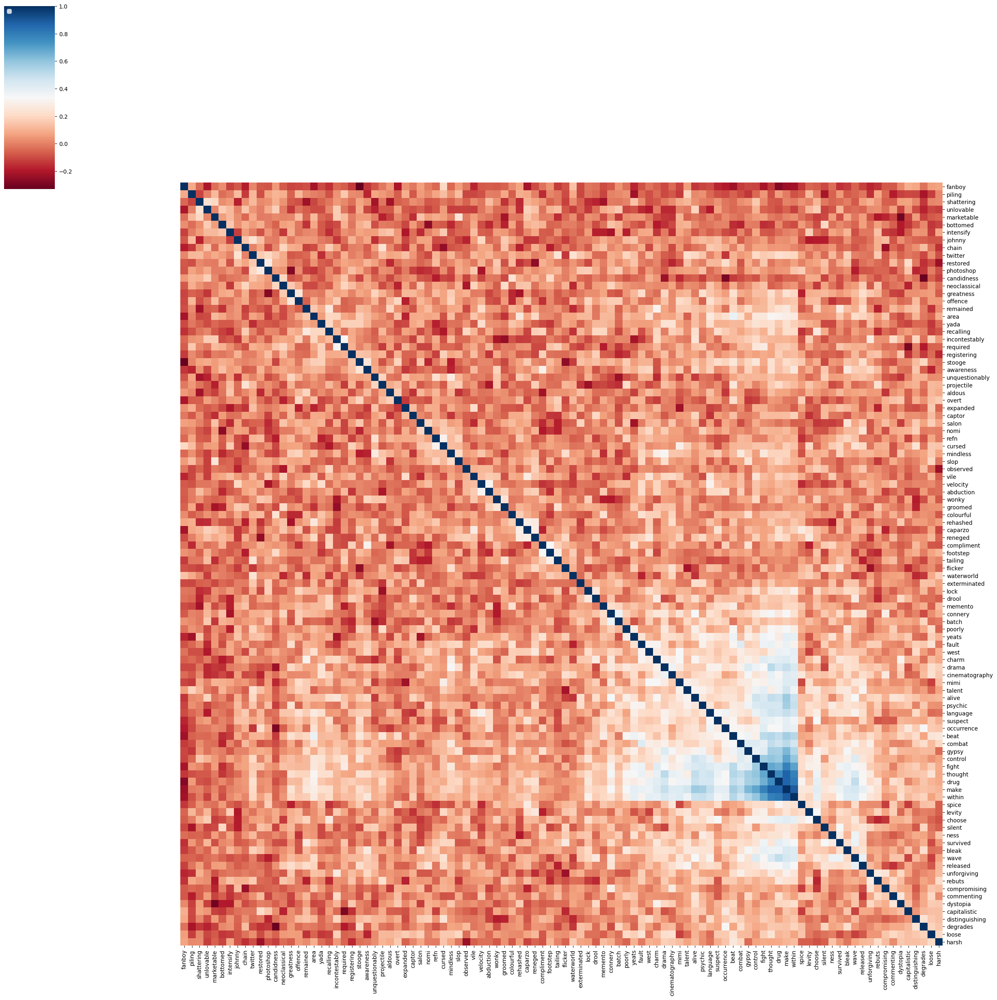

In [208]:
run_word2vec_experiment(documents, clean_method, 100, chosen_tokens, 'Word2Vec_exp')

## Utility functions for Doc2Vec experiments

<div class="alert alert-block alert-success">
    <b>Doc2vec Paragraph Embeddings</b>: https://radimrehurek.com/gensim/models/doc2vec.html <br>
    Paragraph and document embeddings via the distributed memory and distributed bag of words models from Quoc Le and Tomas Mikolov: “Distributed Representations of Sentences and Documents”. <br>

The algorithms use either hierarchical softmax or negative sampling;
            </div>

In [209]:
def run_doc2vec(documents: List[TokenizedDocument], embedding_size: int, descriptors_by_doc_ids: Dict[int, str]):
    tagged_documents = [TaggedDocument(document.tokens, [i]) for i, document in enumerate(documents)]
    doc2vec_model = Doc2Vec(tagged_documents, vector_size=embedding_size, window=3, min_count=2, workers=12)

    doc2vec_df = pd.DataFrame()
    for document in documents:
        vector = pd.DataFrame(doc2vec_model.infer_vector(document.tokens)).transpose()
        doc2vec_df = pd.concat([doc2vec_df, vector], axis=0)

    doc2vec_df['Descriptor'] = [descriptors_by_doc_ids[x.doc_id] for x in documents]
    doc2vec_df.set_index(['Descriptor'], inplace=True)
    return doc2vec_df

def run_doc2vec_experiment(documents: List[Document],
                           clean_func: Callable[[List[Document]], List[TokenizedDocument]],
                           embedding_size: int,
                           experiment_name: str):
    cleaned_documents = clean_func(documents)
    doc2vec_df = run_doc2vec(cleaned_documents, embedding_size, descriptors_by_doc_ids)

    plot_similarity_matrix(doc2vec_df, experiment_name)
    plot_similarity_clustermap(doc2vec_df, experiment_name, figsize=(50, 50))
    plot_tsne(doc2vec_df, 30, experiment_name)

## Doc2Vec Experiments:

<div class="alert alert-block alert-success">
    <b>Doc2vec Paragraph Embeddings</b>: https://radimrehurek.com/gensim/models/doc2vec.html <br>
    Paragraph and document embeddings via the distributed memory and distributed bag of words models from Quoc Le and Tomas Mikolov: “Distributed Representations of Sentences and Documents”. <br>

The algorithms use either hierarchical softmax or negative sampling;
            </div>

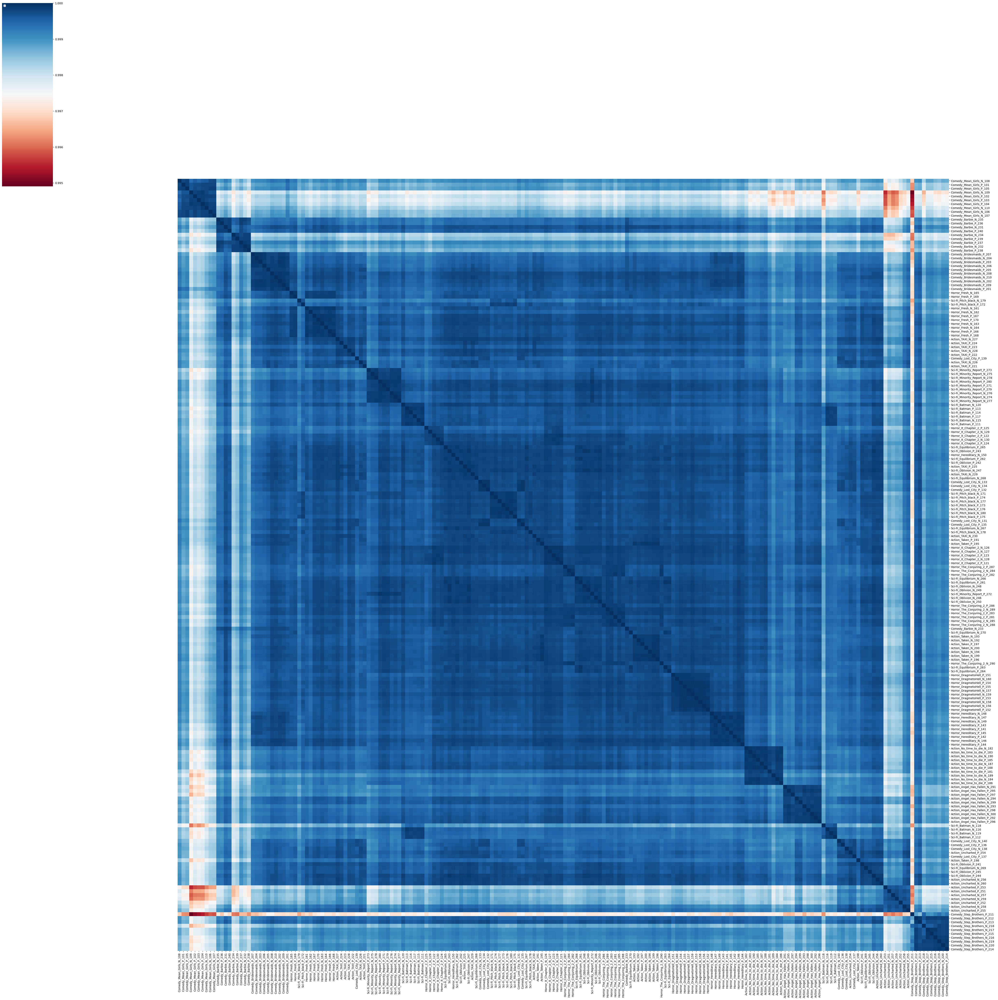

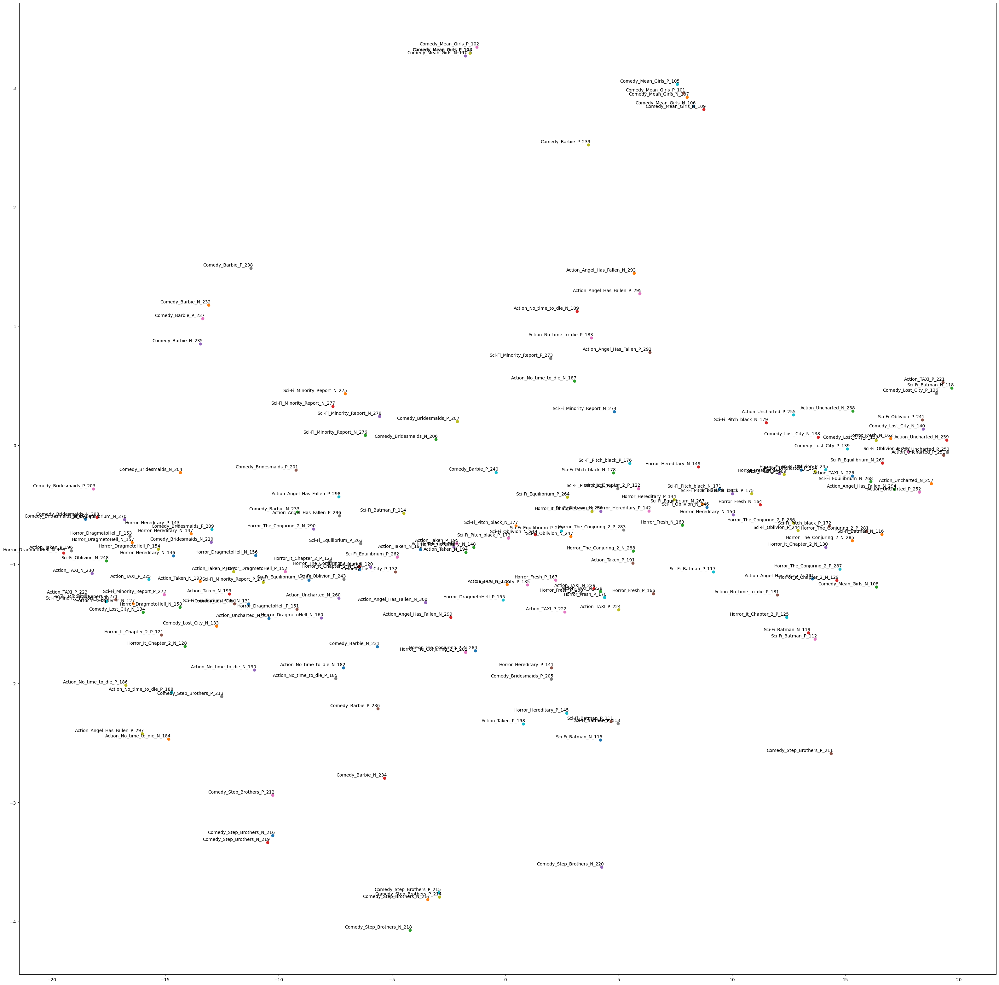

In [210]:
run_doc2vec_experiment(documents, clean_method, 100, 'Doc2Vec_exp_100')

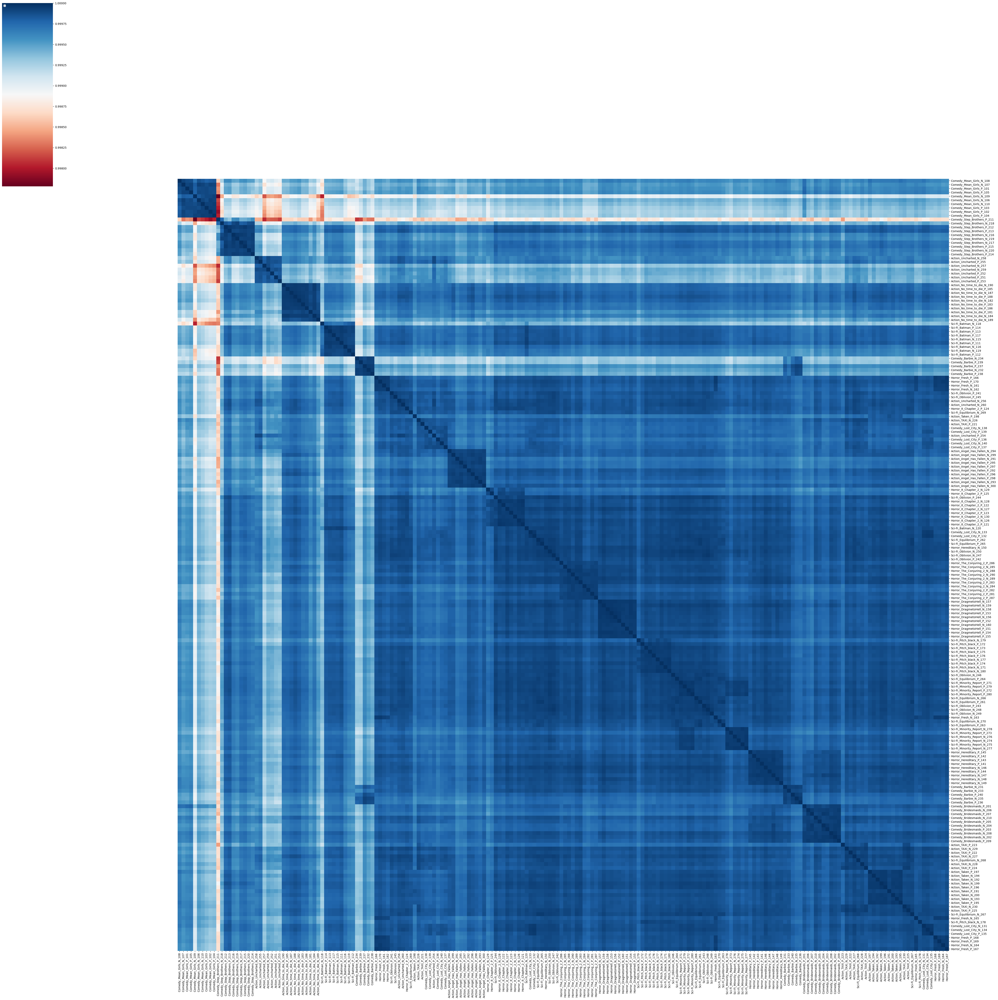

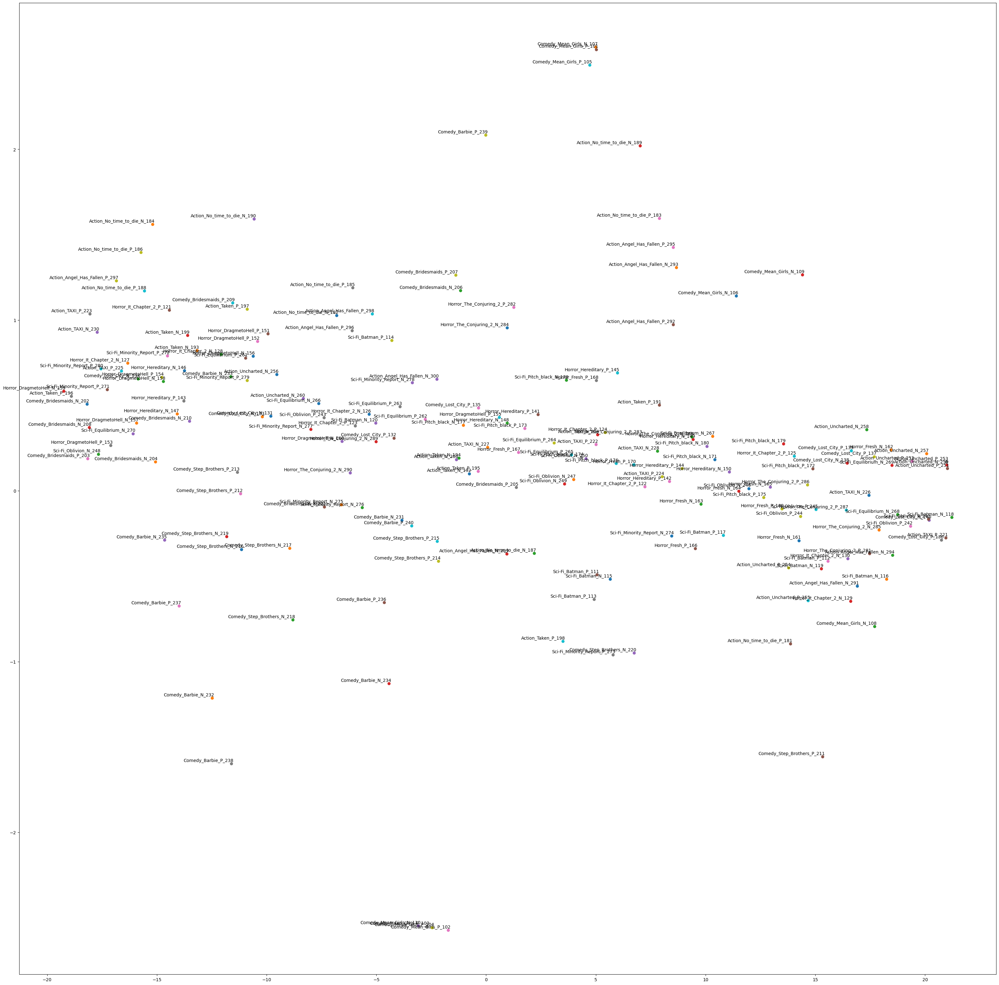

In [211]:
run_doc2vec_experiment(documents, clean_method, 200, 'Doc2Vec_exp_200')

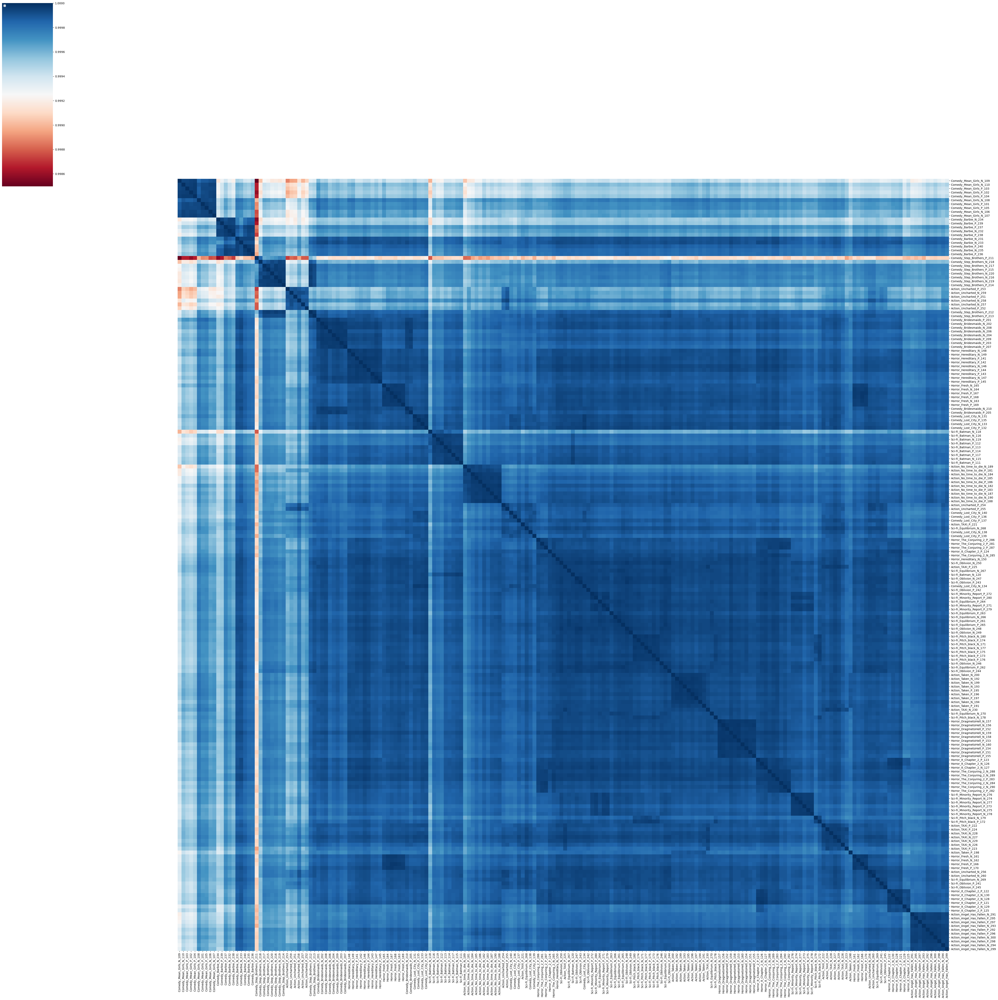

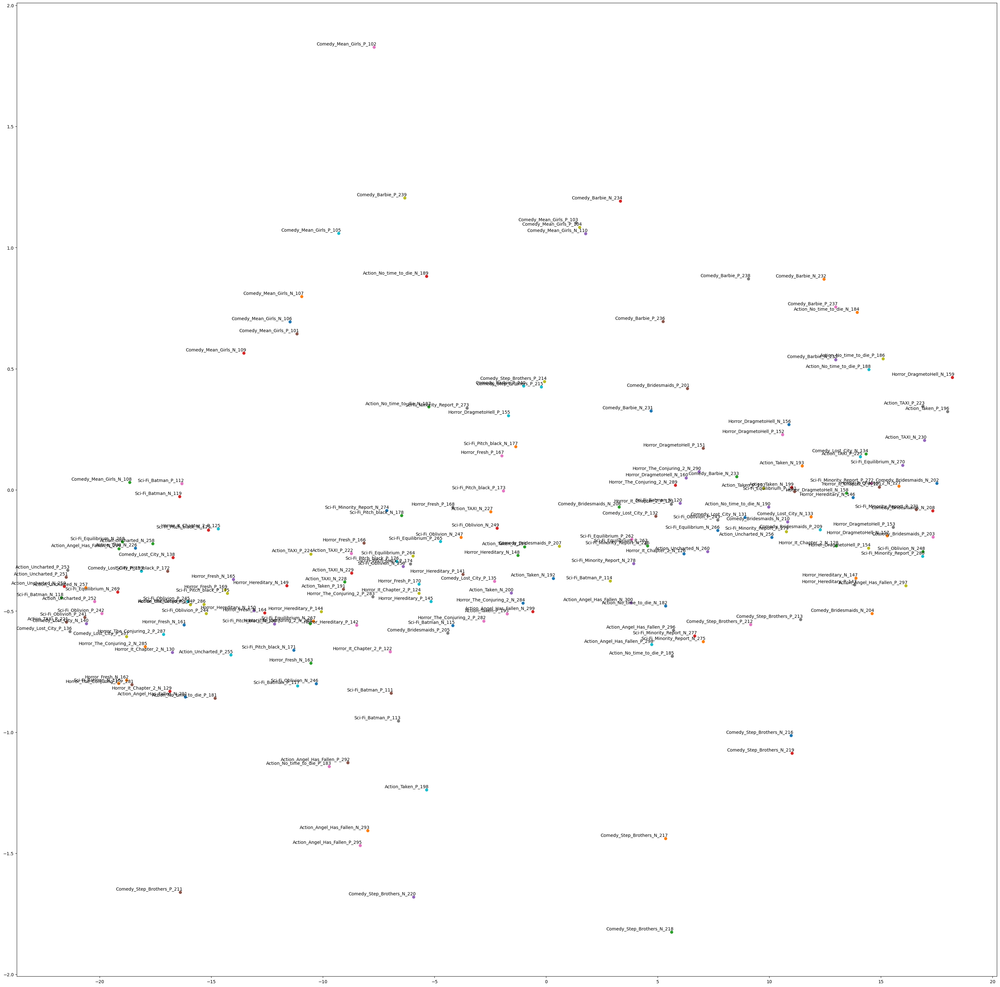

In [212]:
run_doc2vec_experiment(documents, clean_method, 300, 'Doc2Vec_exp_300')

## **ELMO Emeddings**

Explore ELMo (Embeddings from Language Models) embeddings to enhance our text analysis capabilities. Unlike traditional word embeddings that represent words with static vectors, ELMo provides context-aware embeddings, capturing the nuanced meanings of words based on their usage.

This is a TensorFlow 1 version of ELMo, available at Kaggle https://www.kaggle.com/models/google/elmo/frameworks/tensorFlow1/variations/elmo/versions/3 , compatible with modern Python environments, and we use TensorFlow 2 code instead.

In [213]:
#! pip install tensorflow tensorflow-hub

In [214]:
import tensorflow_hub as hub
import tensorflow as tf
import pandas as pd

In [215]:
# TENSOR FLOW 2.x VARIATION

# Load the ELMo model
elmo = hub.load("https://tfhub.dev/google/elmo/3")
embeddings = elmo.signatures['default'](tf.constant(["I have a pen", "I have an apple"]))['elmo']

print(embeddings)


tf.Tensor(
[[[-1.2254355  -0.56004155 -0.17601362 ... -0.48899472 -0.15847605
   -0.02072026]
  [-0.06928669 -0.32243836 -0.20192209 ...  0.06436353 -0.01132806
    0.23569691]
  [ 0.08227284 -0.13877694 -0.11335732 ...  0.09817557 -0.39810365
    0.1064739 ]
  [-0.59798044 -0.06444039 -0.62319255 ...  0.09078256  0.02052066
    0.28290296]]

 [[-1.2254355  -0.56004155 -0.17601362 ... -0.47857666 -0.06792711
    0.08927003]
  [-0.06928669 -0.32243836 -0.20192209 ...  0.31662846  0.21778789
    0.25088534]
  [-0.15906422 -0.04295161 -0.49626738 ...  0.30489403 -0.08282581
    0.16055614]
  [ 0.33383614 -0.15934686  0.57856274 ...  0.14826375  0.4691132
    0.6117441 ]]], shape=(2, 4, 1024), dtype=float32)


In [216]:
def get_elmo_embeddings(texts):
    """
    Generate ELMo embeddings for a list of texts.

    Parameters:
    - texts: List of strings

    Returns:
    - A Tensor containing the ELMo embeddings for the input texts.
    """
    # Convert texts to TensorFlow constants
    text_tf = tf.constant(texts)

    # Generate ELMo embeddings
    embeddings = elmo.signatures['default'](text_tf)['elmo']

    return embeddings

In [217]:
#documents

In [218]:
# NO DATA WRANGLING
texts = corpus_df['Text'].tolist()

# OR UNCOMMENT FOR DATA WRANGLING
#cleaned_documents = clean_method(documents)
#texts = [' '.join(x.tokens) for x in cleaned_documents]


In [219]:
# Process in batches to manage memory usage
batch_size = 4
# Start with a smaller batch size to monitor performance
# 4 works in Google Collab

all_embeddings = []

# GET ELMO EMBEDDINGS OVER A SUBSET OF ALL MOVIE REVIEWS
sample_size=40

# OR UNCOMMENT TO RUN FOR ALL MOVIE REVIEWS
# Note: Processing all reviews takes over 30 minutes to run.
#sample_size= len(texts)

for i in range(0, sample_size, batch_size):
    batch_texts = texts[i:i+batch_size]
    batch_embeddings = get_elmo_embeddings(batch_texts)
    all_embeddings.append(batch_embeddings)
    print(f"Processed batch {i//batch_size + 1}/{len(texts)//batch_size + 1}")


Processed batch 1/51
Processed batch 2/51
Processed batch 3/51
Processed batch 4/51
Processed batch 5/51
Processed batch 6/51
Processed batch 7/51
Processed batch 8/51
Processed batch 9/51
Processed batch 10/51


In [222]:
# Convert the list of tensors to a single numpy array
all_embeddings_np = np.concatenate([batch.numpy().mean(axis=1) for batch in all_embeddings], axis=0)


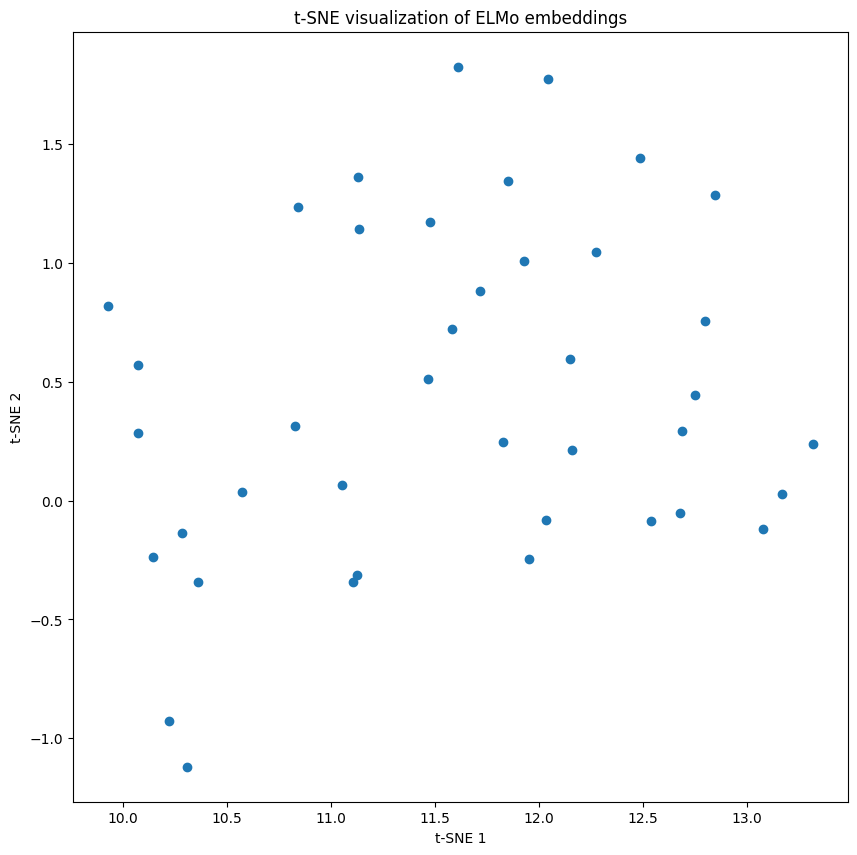

In [223]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Use t-SNE to reduce dimensionality for visualization
if (sample_size>=30):
    tsne = TSNE(n_components=2, random_state=42)
else:
    # Default perplexity is too large for a small sample size
    tsne = TSNE(n_components=2, random_state=42, perplexity=sample_size-1)

embeddings_tsne = tsne.fit_transform(all_embeddings_np)

# Plot
plt.figure(figsize=(10, 10))
plt.scatter(embeddings_tsne[:, 0], embeddings_tsne[:, 1])
plt.title('t-SNE visualization of ELMo embeddings')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()


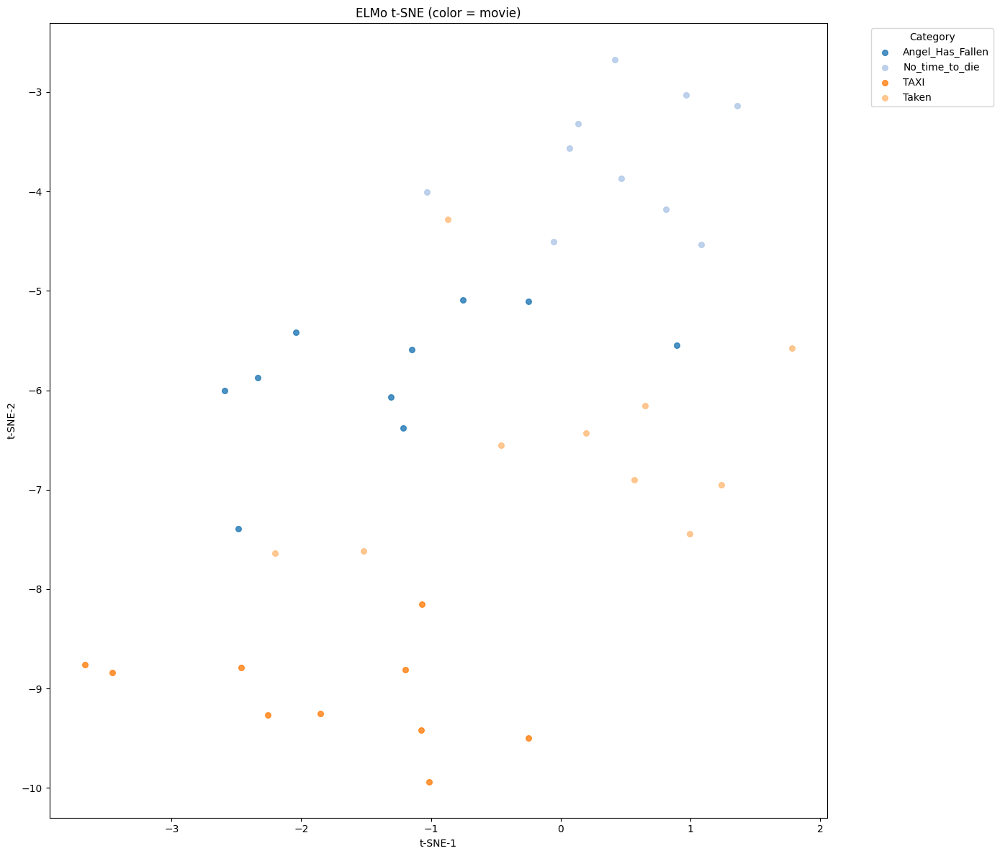

In [224]:
# NEW

# [NEW] ELMo t-SNE colored by movie (uses all_embeddings_np from your ELMo section)

import pandas as pd
from sklearn.manifold import TSNE

# Number of embedded reviews = number of rows in the ELMo array
n_used = all_embeddings_np.shape[0]

doc_ids_for_embeddings = list(corpus_df.index)[:n_used]

# movie labels for those doc ids
movie_labels = [titles_by_doc_ids[doc_id] for doc_id in doc_ids_for_embeddings]

# Ensure IDs align with the embeddings
n_points = all_embeddings_np.shape[0]
doc_ids_for_embeddings = list(corpus_df.index)[:n_points]

# Build the dataframe of ELMo document vectors
elmo_doc_df = pd.DataFrame(all_embeddings_np, index=doc_ids_for_embeddings)

# Movie labels aligned to those doc IDs
movie_series = pd.Series({doc_id: titles_by_doc_ids[doc_id] for doc_id in elmo_doc_df.index})

# Call the utility with the expected argument name
unused_return_result= plot_tsne_by_category(elmo_doc_df, movie_series, title="ELMo t-SNE (color = movie)")
# ^- unused_return_result prevents large array from being printed out in notebook

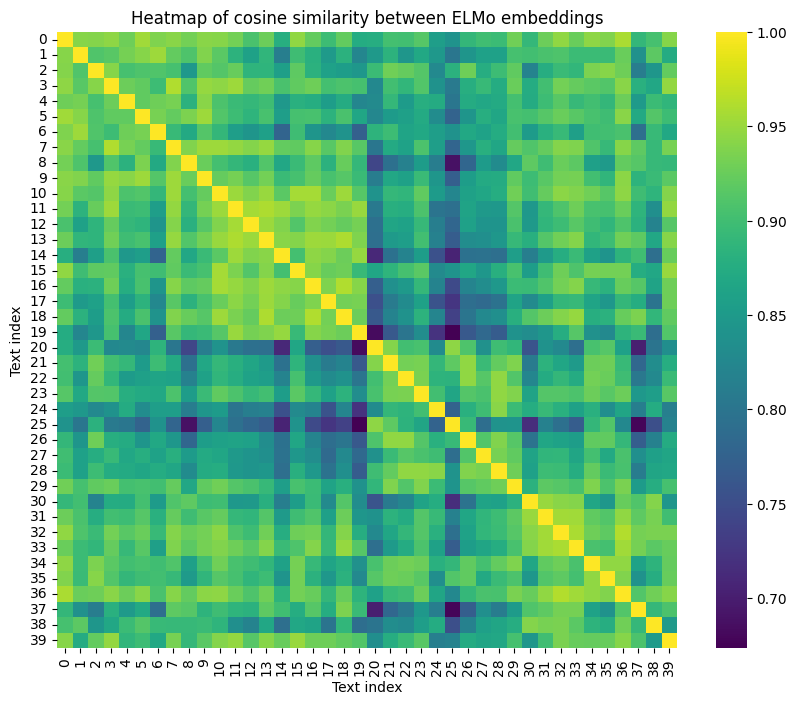

In [225]:
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

# Compute the cosine similarity matrix
similarity_matrix = cosine_similarity(all_embeddings_np)

# Plot as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(similarity_matrix, cmap='viridis')
plt.title('Heatmap of cosine similarity between ELMo embeddings')
plt.xlabel('Text index')
plt.ylabel('Text index')
plt.show()


In [226]:
! pip freeze

absl-py==1.4.0
absolufy-imports==0.3.1
accelerate==1.10.1
aiofiles==24.1.0
aiohappyeyeballs==2.6.1
aiohttp==3.12.15
aiosignal==1.4.0
alabaster==1.0.0
albucore==0.0.24
albumentations==2.0.8
ale-py==0.11.2
alembic==1.16.5
altair==5.5.0
annotated-types==0.7.0
antlr4-python3-runtime==4.9.3
anyio==4.11.0
anywidget==0.9.18
argon2-cffi==25.1.0
argon2-cffi-bindings==25.1.0
array_record==0.8.1
arrow==1.3.0
arviz==0.22.0
astropy==7.1.0
astropy-iers-data==0.2025.9.29.0.35.48
astunparse==1.6.3
atpublic==5.1
attrs==25.3.0
audioread==3.0.1
Authlib==1.6.4
autograd==1.8.0
babel==2.17.0
backcall==0.2.0
beartype==0.21.0
beautifulsoup4==4.13.5
betterproto==2.0.0b6
bigframes==2.23.0
bigquery-magics==0.10.3
bleach==6.2.0
blinker==1.9.0
blis==1.3.0
blobfile==3.1.0
blosc2==3.9.1
bokeh==3.7.3
Bottleneck==1.4.2
bqplot==0.12.45
branca==0.8.1
Brotli==1.1.0
build==1.3.0
CacheControl==0.14.3
cachetools==5.5.2
catalogue==2.0.10
certifi==2025.8.3
cffi==2.0.0
chardet==5.2.0
charset-normalizer==3.4.3
chex==0.1.90
clar

In [227]:
!pip list --format=freeze

absl-py==1.4.0
absolufy-imports==0.3.1
accelerate==1.10.1
aiofiles==24.1.0
aiohappyeyeballs==2.6.1
aiohttp==3.12.15
aiosignal==1.4.0
alabaster==1.0.0
albucore==0.0.24
albumentations==2.0.8
ale-py==0.11.2
alembic==1.16.5
altair==5.5.0
annotated-types==0.7.0
antlr4-python3-runtime==4.9.3
anyio==4.11.0
anywidget==0.9.18
argon2-cffi==25.1.0
argon2-cffi-bindings==25.1.0
array_record==0.8.1
arrow==1.3.0
arviz==0.22.0
astropy==7.1.0
astropy-iers-data==0.2025.9.29.0.35.48
astunparse==1.6.3
atpublic==5.1
attrs==25.3.0
audioread==3.0.1
Authlib==1.6.4
autograd==1.8.0
babel==2.17.0
backcall==0.2.0
beartype==0.21.0
beautifulsoup4==4.13.5
betterproto==2.0.0b6
bigframes==2.23.0
bigquery-magics==0.10.3
bleach==6.2.0
blinker==1.9.0
blis==1.3.0
blobfile==3.1.0
blosc2==3.9.1
bokeh==3.7.3
Bottleneck==1.4.2
bqplot==0.12.45
branca==0.8.1
Brotli==1.1.0
build==1.3.0
CacheControl==0.14.3
cachetools==5.5.2
catalogue==2.0.10
certifi==2025.8.3
cffi==2.0.0
chardet==5.2.0
charset-normalizer==3.4.3
chex==0.1.90
clar

In [234]:
!jupyter nbconvert --to html "/content/gdrive/MyDrive/Colab Notebooks/MSDS 453/MSDS453_Assignment_01_v28_20250923_MKN.ipynb" \
    --output "/content/MSDS453_Assignment_01_v28_20250923_MKN_10052025.html"


[NbConvertApp] Converting notebook /content/gdrive/MyDrive/Colab Notebooks/MSDS 453/MSDS453_Assignment_01_v28_20250923_MKN.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 41 image(s).
[NbConvertApp] Writing 14826048 bytes to /content/MSDS453_Assignment_01_v28_20250923_MKN_10052025.html


In [235]:
from google.colab import files
files.download("/content/MSDS453_Assignment_01_v28_20250923_MKN_10052025.html")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [72]:
#END OF CODE